In [449]:
import pandas as pd
import seaborn as ans
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import mean_squared_error,mean_absolute_error
import warnings
warnings.filterwarnings('ignore')


In [42]:
df=pd.read_csv("Housing_train.csv")

In [43]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [278]:
df.sample()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
728,1,1,0,0,3,0,4,0,21,2,...,4,2,0,102,2,2,2,6,5,208300


In [44]:
df.shape

(1168, 81)

In [288]:
pd.set_option('display.max_rows',None)

In [48]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [49]:
df.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,True,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
4,False,False,False,True,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
5,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
6,False,False,False,True,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
7,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
8,False,False,False,False,False,False,True,False,False,False,...,False,True,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False


In [50]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

Null values present in LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,          
BsmtFinType2,FireplaceQu,GarageType,GarageYrBlt,GarageFinish ,GarageQual,GarageCond,PoolQC,Fence,             
MiscFeature.                       

In [51]:
df_cor=df.corr()

In [289]:
df_cor

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.004259,-0.006629,-0.029212,-0.036965,0.039761,-0.016942,-0.018590,-0.060652,0.003868,...,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,0.001304,0.023479,-0.008853,-0.023897
MSSubClass,0.004259,1.000000,-0.365220,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.027868,-0.052236,...,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.006629,-0.365220,1.000000,0.557257,0.247809,-0.053345,0.118554,0.096050,0.202225,0.247780,...,0.101751,0.167092,0.023118,0.059508,0.033111,0.223429,-0.004559,0.025046,-0.004296,0.341294
LotArea,-0.029212,-0.124151,0.557257,1.000000,0.107188,0.017513,0.005506,0.027228,0.121448,0.221851,...,0.216720,0.093080,-0.007446,0.025794,0.025256,0.097107,0.051679,0.015141,-0.035399,0.249499
OverallQual,-0.036965,0.070462,0.247809,0.107188,1.000000,-0.083167,0.575800,0.555945,0.409163,0.219643,...,0.227137,0.341030,-0.098374,0.045919,0.059387,0.072247,-0.025786,0.090638,-0.048759,0.789185
OverallCond,0.039761,-0.056978,-0.053345,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.137882,-0.028810,...,0.012290,-0.024899,0.056074,0.040476,0.069463,-0.003603,0.075178,0.005519,0.055517,-0.065642
YearBuilt,-0.016942,0.023988,0.118554,0.005506,0.575800,-0.377731,1.000000,0.592829,0.323006,0.227933,...,0.204830,0.191069,-0.373544,0.037079,-0.058760,0.006408,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,-0.018590,0.056618,0.096050,0.027228,0.555945,0.080669,0.592829,1.000000,0.181869,0.114430,...,0.197410,0.238755,-0.193574,0.064763,-0.046220,0.006874,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,-0.060652,0.027868,0.202225,0.121448,0.409163,-0.137882,0.323006,0.181869,1.000000,0.267066,...,0.151978,0.131850,-0.102321,0.018721,0.046509,0.013590,-0.027583,0.013432,-0.013493,0.466386
BsmtFinSF1,0.003868,-0.052236,0.247780,0.221851,0.219643,-0.028810,0.227933,0.114430,0.267066,1.000000,...,0.192939,0.108802,-0.082351,0.025485,0.033490,0.154769,0.008314,0.007482,0.005614,0.362874


Sale price is highly correlate with OverallQual,YearBuilt,YearRemodAdd and MasVnrArea.
Sale price is least correlate with MiscVal,YrSold,Id and MSSubClass.

# Removing Null Values

In [53]:
from sklearn.impute import SimpleImputer
imp=SimpleImputer(strategy='most_frequent')
df['LotFrontage']=imp.fit_transform(df['LotFrontage'].values.reshape(-1,1))
df['Alley']=imp.fit_transform(df['Alley'].values.reshape(-1,1))


df['MasVnrType']=imp.fit_transform(df['MasVnrType'].values.reshape(-1,1))
df['MasVnrArea']=imp.fit_transform(df['MasVnrArea'].values.reshape(-1,1))


df['BsmtQual']=imp.fit_transform(df['BsmtQual'].values.reshape(-1,1))
df['BsmtCond']=imp.fit_transform(df['BsmtCond'].values.reshape(-1,1))


df['BsmtExposure']=imp.fit_transform(df['BsmtExposure'].values.reshape(-1,1))
df['BsmtFinType1']=imp.fit_transform(df['BsmtFinType1'].values.reshape(-1,1))


df['BsmtFinType2']=imp.fit_transform(df['BsmtFinType2'].values.reshape(-1,1))
df['FireplaceQu']=imp.fit_transform(df['FireplaceQu'].values.reshape(-1,1))


df['GarageType']=imp.fit_transform(df['GarageType'].values.reshape(-1,1))
df['GarageYrBlt']=imp.fit_transform(df['GarageYrBlt'].values.reshape(-1,1))


df['GarageFinish']=imp.fit_transform(df['GarageFinish'].values.reshape(-1,1))
df['GarageQual']=imp.fit_transform(df['GarageQual'].values.reshape(-1,1))


df['GarageCond']=imp.fit_transform(df['GarageCond'].values.reshape(-1,1))
df['PoolQC']=imp.fit_transform(df['PoolQC'].values.reshape(-1,1))



df['Fence']=imp.fit_transform(df['Fence'].values.reshape(-1,1))
df['MiscFeature']=imp.fit_transform(df['MiscFeature'].values.reshape(-1,1))

In [54]:
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

No Null Values.

In [55]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,60.0,4928,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,1,2010,COD,Normal,190000
4,422,20,RL,60.0,16635,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2009,WD,Normal,215000


# Converting String Variable into Numeric.

we need to change string variable into numerical value.

In [56]:

from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['MSZoning']=le.fit_transform(df['MSZoning'])
df['Street']=le.fit_transform(df['Street'])
df['Alley']=le.fit_transform(df['Alley'])
df['LotShape']=le.fit_transform(df['LotShape'])
df['LandContour']=le.fit_transform(df['LandContour'])
df['Utilities']=le.fit_transform(df['Utilities'])
df['LotConfig']=le.fit_transform(df['LotConfig'])
df['LandSlope']=le.fit_transform(df['LandSlope'])
df['Neighborhood']=le.fit_transform(df['Neighborhood'])
df['Condition1']=le.fit_transform(df['Condition1'])

df['Condition2']=le.fit_transform(df['Condition2'])
df['BldgType']=le.fit_transform(df['BldgType'])
df['HouseStyle']=le.fit_transform(df['HouseStyle'])
df['RoofStyle']=le.fit_transform(df['RoofStyle'])
df['RoofMatl']=le.fit_transform(df['RoofMatl'])
df['Exterior1st']=le.fit_transform(df['Exterior1st'])
df['Exterior2nd']=le.fit_transform(df['Exterior2nd'])
df['MasVnrType']=le.fit_transform(df['MasVnrType'])


df['ExterQual']=le.fit_transform(df['ExterQual'])
df['ExterCond']=le.fit_transform(df['ExterCond'])
df['Foundation']=le.fit_transform(df['Foundation'])
df['BsmtQual']=le.fit_transform(df['BsmtQual'])
df['BsmtCond']=le.fit_transform(df['BsmtCond'])
df['BsmtExposure']=le.fit_transform(df['BsmtExposure'])
df['BsmtFinType1']=le.fit_transform(df['BsmtFinType1'])
df['BsmtFinType2']=le.fit_transform(df['BsmtFinType2'])
df['Heating']=le.fit_transform(df['Heating'])
df['HeatingQC']=le.fit_transform(df['HeatingQC'])

df['CentralAir']=le.fit_transform(df['CentralAir'])
df['Electrical']=le.fit_transform(df['Electrical'])
df['KitchenQual']=le.fit_transform(df['KitchenQual'])
df['Functional']=le.fit_transform(df['Functional'])
df['FireplaceQu']=le.fit_transform(df['FireplaceQu'])
df['GarageType']=le.fit_transform(df['GarageType'])
df['GarageFinish']=le.fit_transform(df['GarageFinish'])
df['GarageQual']=le.fit_transform(df['GarageQual'])
df['GarageCond']=le.fit_transform(df['GarageCond'])
df['PavedDrive']=le.fit_transform(df['PavedDrive'])

df['PoolQC']=le.fit_transform(df['PoolQC'])
df['Fence']=le.fit_transform(df['Fence'])
df['MiscFeature']=le.fit_transform(df['MiscFeature'])
df['SaleType']=le.fit_transform(df['SaleType'])
df['SaleCondition']=le.fit_transform(df['SaleCondition'])



In [57]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,60.0,4928,1,0,0,3,0,...,0,2,2,2,0,2,2007,8,4,128000
1,889,20,3,95.0,15865,1,0,0,3,0,...,0,2,2,2,0,10,2007,8,4,268000
2,793,60,3,92.0,9920,1,0,0,3,0,...,0,2,2,2,0,6,2007,8,4,269790
3,110,20,3,105.0,11751,1,0,0,3,0,...,0,2,2,2,0,1,2010,0,4,190000
4,422,20,3,60.0,16635,1,0,0,3,0,...,0,2,2,2,0,6,2009,8,4,215000


<AxesSubplot:>

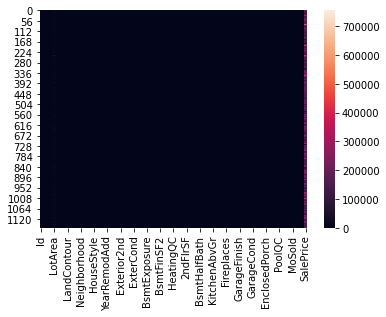

In [58]:
sns.heatmap(df)

No Null Values

<AxesSubplot:>

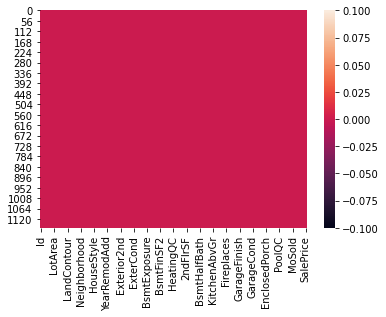

In [59]:
sns.heatmap(df.isnull())

No  Null Values

<AxesSubplot:>

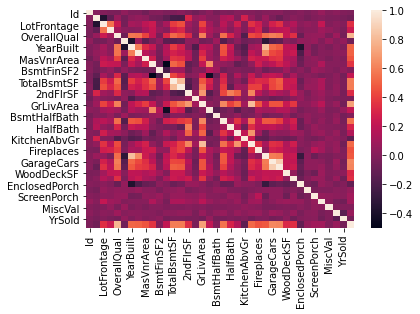

In [60]:
sns.heatmap(df_cor)

<AxesSubplot:>

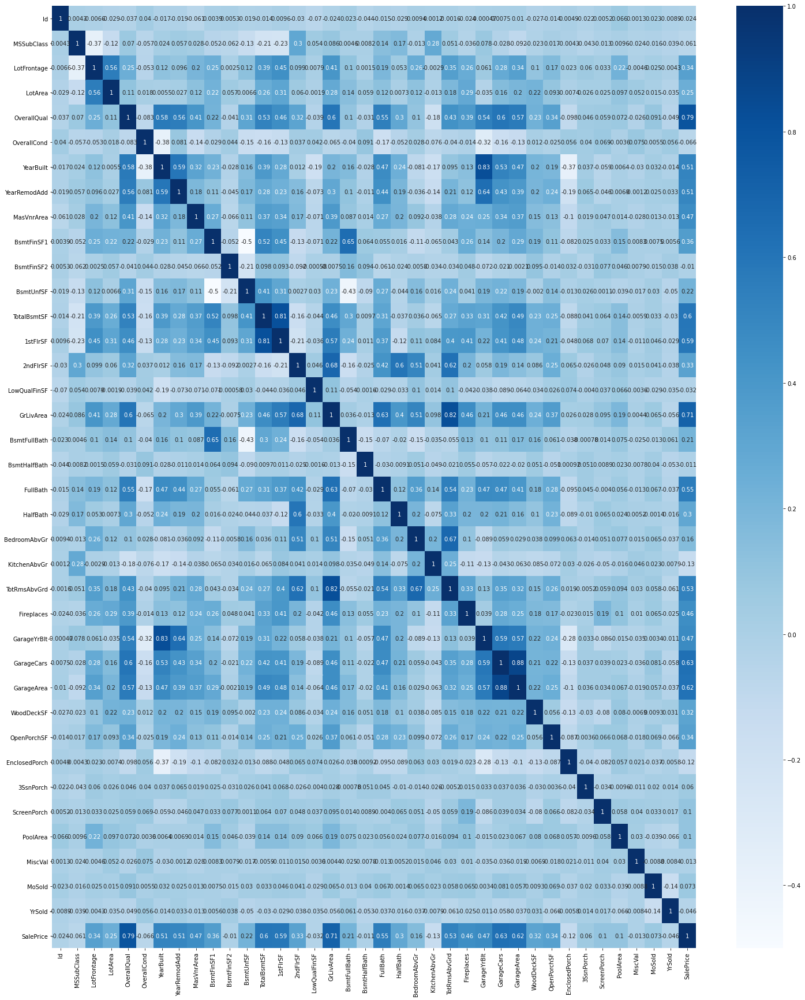

In [61]:
plt.figure(figsize=(25,30))
sns.heatmap(df_cor,cmap='Blues',annot=True)

SalePrice is highly correlated with OverallQual,GrLivArea,GarageCars,GarageArea and
less correlated with Id,BsmtFinSF2,BsmtHalfBath and EnclosedPorch.

we can remove some columns which are less correlate with Target column.

In [72]:
df.drop('Id',axis=1,inplace=True)

In [ ]:
df.drop('MSSubClass',axis=1,inplace=True)
df.drop('LotFrontage',axis=1,inplace=True)
df.drop('LotArea',axis=1,inplace=True)
df.drop('OverallCond',axis=1,inplace=True)
df.drop('BsmtFinSF1',axis=1,inplace=True)
df.drop('BsmtFinSF2',axis=1,inplace=True)
df.drop('BsmtUnfSF',axis=1,inplace=True)
df.drop('2ndFlrSF',axis=1,inplace=True)
df.drop('LowQualFinSF',axis=1,inplace=True)
df.drop('BsmtFullBath',axis=1,inplace=True)

df.drop('BsmtHalfBath',axis=1,inplace=True)
df.drop('HalfBath',axis=1,inplace=True)
df.drop('BedroomAbvGr',axis=1,inplace=True)

df.drop('KitchenAbvGr',axis=1,inplace=True)
df.drop('EnclosedPorch',axis=1,inplace=True)

df.drop('3SsnPorch',axis=1,inplace=True)
df.drop('ScreenPorch',axis=1,inplace=True)


df.drop('PoolArea',axis=1,inplace=True)
df.drop('MiscVal',axis=1,inplace=True)
df.drop('MoSold',axis=1,inplace=True)
df.drop('YrSold',axis=1,inplace=True)

In [474]:
df.drop('PoolQC',axis=1,inplace=True)

In [475]:
df.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,4,2,0.0,105,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,4,2,81.0,105,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,4,2,180.0,105,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,4,2,0.0,105,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,4,2,240.0,0,2,2,8,4,215000


In [476]:
df.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', 'GrLivArea', 'FullBath', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

<AxesSubplot:xlabel='MSZoning', ylabel='Density'>

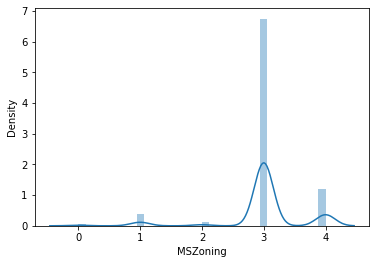

In [75]:
sns.distplot(df['MSZoning'])

<AxesSubplot:xlabel='MSZoning', ylabel='Density'>

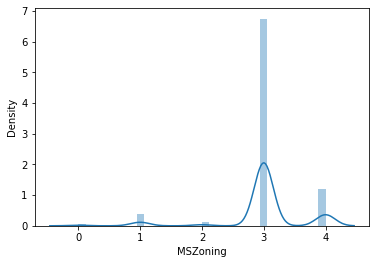

In [70]:
sns.distplot(df['Street'])

Skewness present

In [71]:
df.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', 'GrLivArea', 'FullBath', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'PoolQC', 'Fence',
       'MiscFeature', 'SaleType', 'SaleCondition', 'SalePrice', 'Id'],
      dtype='object')

<AxesSubplot:xlabel='Alley', ylabel='Density'>

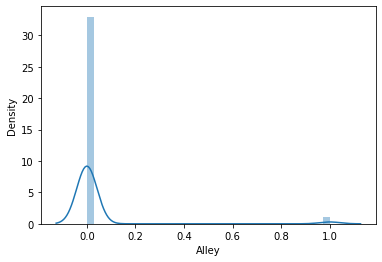

In [76]:
sns.distplot(df['Alley'])

<AxesSubplot:xlabel='LotShape', ylabel='Density'>

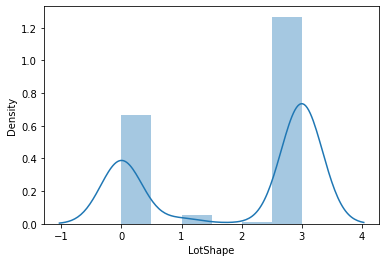

In [77]:
sns.distplot(df['LotShape'])

<AxesSubplot:xlabel='LandContour', ylabel='Density'>

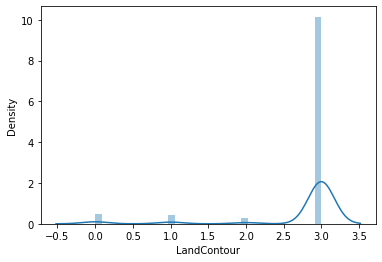

In [78]:
sns.distplot(df['LandContour'])

<AxesSubplot:xlabel='Utilities', ylabel='Density'>

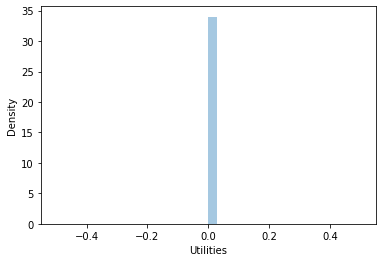

In [79]:
sns.distplot(df['Utilities'])

<AxesSubplot:xlabel='LotConfig', ylabel='Density'>

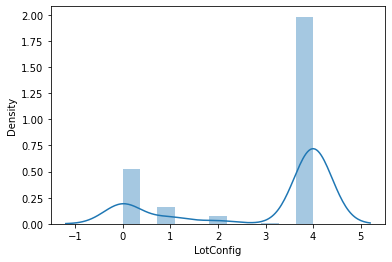

In [80]:
sns.distplot(df['LotConfig'])

<AxesSubplot:xlabel='LandSlope', ylabel='Density'>

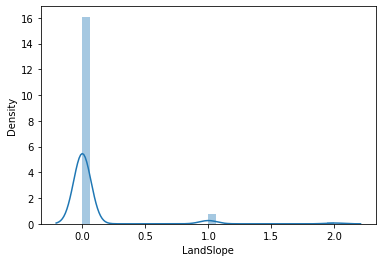

In [81]:
sns.distplot(df['LandSlope'])

<AxesSubplot:xlabel='Neighborhood', ylabel='Density'>

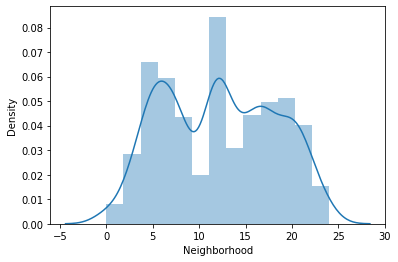

In [82]:
sns.distplot(df['Neighborhood'])

<AxesSubplot:xlabel='Condition1', ylabel='Density'>

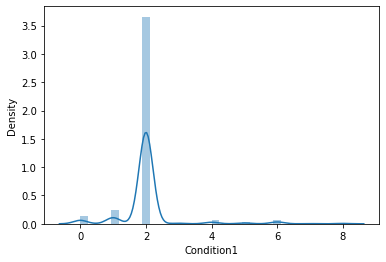

In [83]:
sns.distplot(df['Condition1'])

<AxesSubplot:xlabel='Condition2', ylabel='Density'>

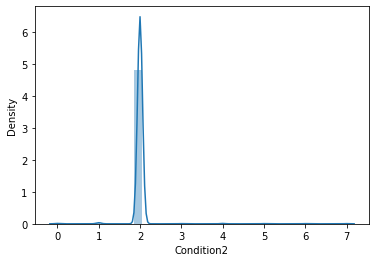

In [84]:
sns.distplot(df['Condition2'])

<AxesSubplot:xlabel='BldgType', ylabel='Density'>

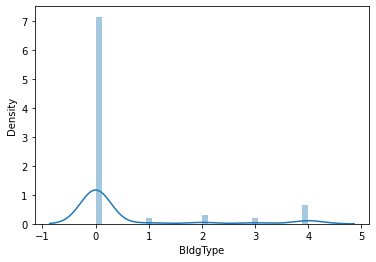

In [85]:
sns.distplot(df['BldgType'])

<AxesSubplot:xlabel='HouseStyle', ylabel='Density'>

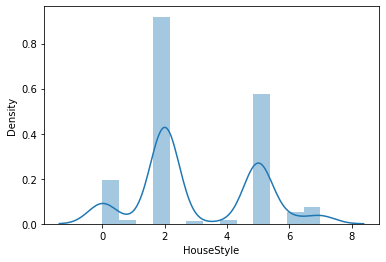

In [86]:
sns.distplot(df['HouseStyle'])

<AxesSubplot:xlabel='OverallQual', ylabel='Density'>

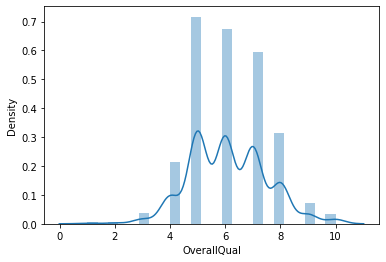

In [87]:
sns.distplot(df['OverallQual'])

<AxesSubplot:xlabel='YearBuilt', ylabel='Density'>

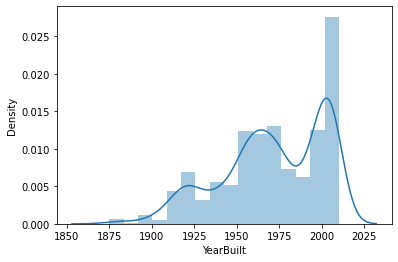

In [88]:
sns.distplot(df['YearBuilt'])

<AxesSubplot:xlabel='YearRemodAdd', ylabel='Density'>

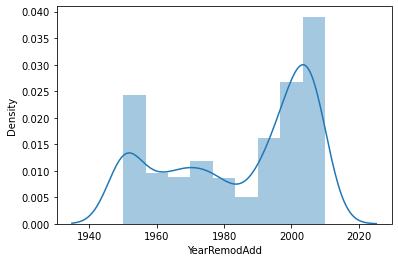

In [89]:
sns.distplot(df['YearRemodAdd'])

<AxesSubplot:xlabel='RoofStyle', ylabel='Density'>

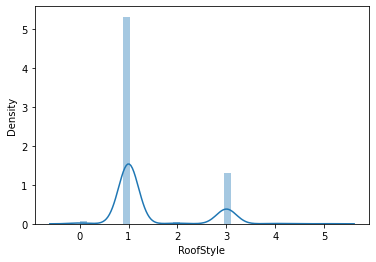

In [90]:
sns.distplot(df['RoofStyle'])

<AxesSubplot:xlabel='RoofMatl', ylabel='Density'>

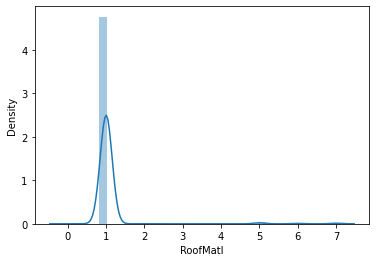

In [91]:
sns.distplot(df['RoofMatl'])

<AxesSubplot:xlabel='Exterior1st', ylabel='Density'>

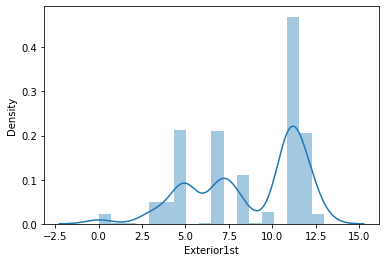

In [92]:
sns.distplot(df['Exterior1st'])

<AxesSubplot:xlabel='Exterior2nd', ylabel='Density'>

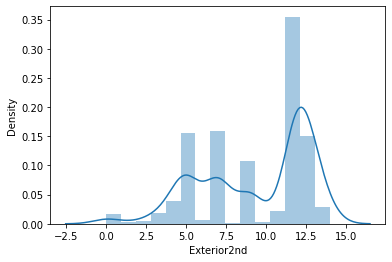

In [93]:
sns.distplot(df['Exterior2nd'])

<AxesSubplot:xlabel='MasVnrType', ylabel='Density'>

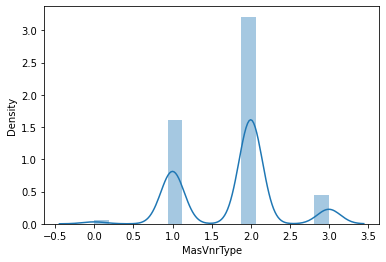

In [94]:
sns.distplot(df['MasVnrType'])

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

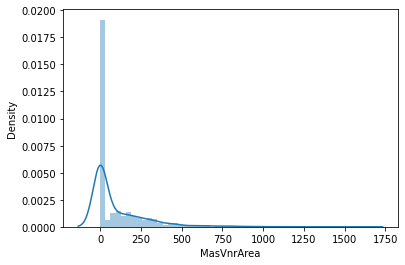

In [95]:
sns.distplot(df['MasVnrArea'])

<AxesSubplot:xlabel='ExterQual', ylabel='Density'>

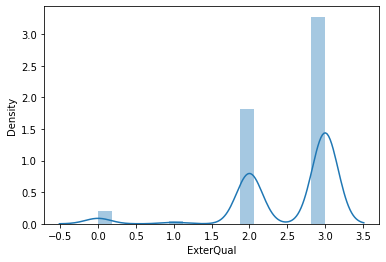

In [96]:
sns.distplot(df['ExterQual'])

<AxesSubplot:xlabel='ExterCond', ylabel='Density'>

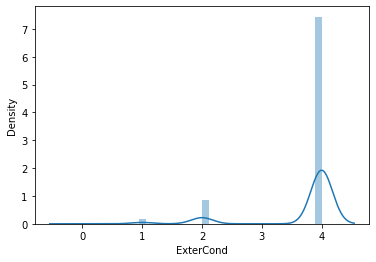

In [97]:
sns.distplot(df['ExterCond'])

<AxesSubplot:xlabel='Foundation', ylabel='Density'>

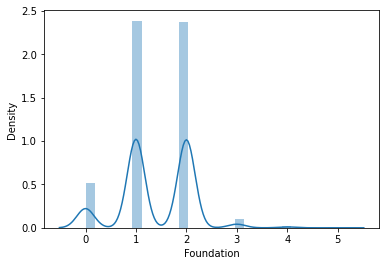

In [98]:
sns.distplot(df['Foundation'])

<AxesSubplot:xlabel='BsmtQual', ylabel='Density'>

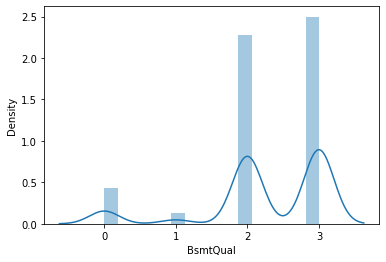

In [99]:
sns.distplot(df['BsmtQual'])

<AxesSubplot:xlabel='BsmtCond', ylabel='Density'>

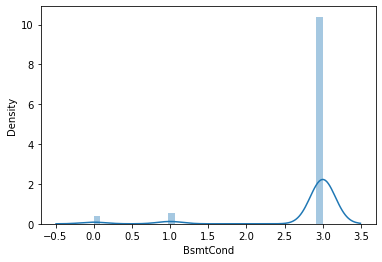

In [100]:
sns.distplot(df['BsmtCond'])

<AxesSubplot:xlabel='BsmtExposure', ylabel='Density'>

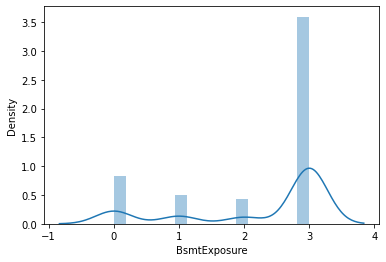

In [101]:
sns.distplot(df['BsmtExposure'])

<AxesSubplot:xlabel='BsmtFinType1', ylabel='Density'>

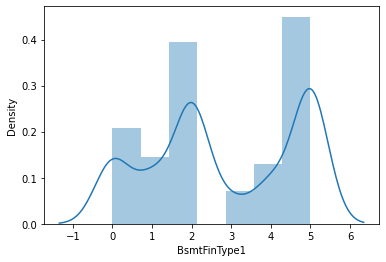

In [102]:
sns.distplot(df['BsmtFinType1'])

<AxesSubplot:xlabel='BsmtFinType2', ylabel='Density'>

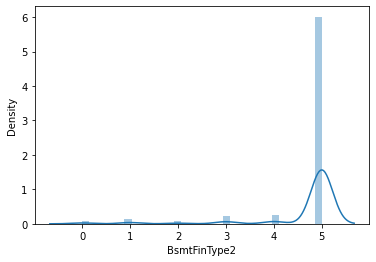

In [103]:
sns.distplot(df['BsmtFinType2'])

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

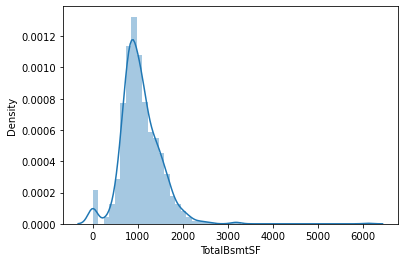

In [104]:
sns.distplot(df['TotalBsmtSF'])

<AxesSubplot:xlabel='Heating', ylabel='Density'>

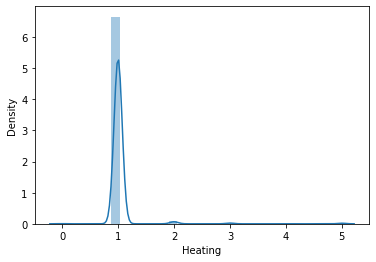

In [105]:
sns.distplot(df['Heating'])

<AxesSubplot:xlabel='HeatingQC', ylabel='Density'>

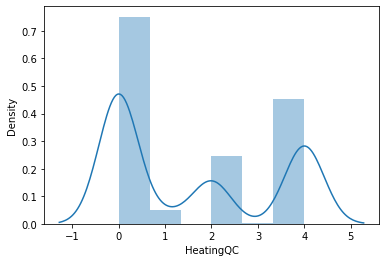

In [106]:
sns.distplot(df['HeatingQC'])

<AxesSubplot:xlabel='CentralAir', ylabel='Density'>

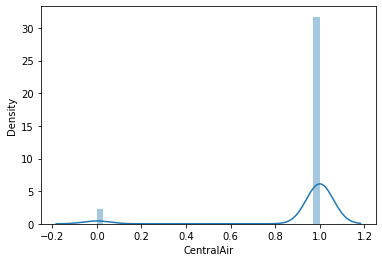

In [107]:
sns.distplot(df['CentralAir'])

<AxesSubplot:xlabel='Electrical', ylabel='Density'>

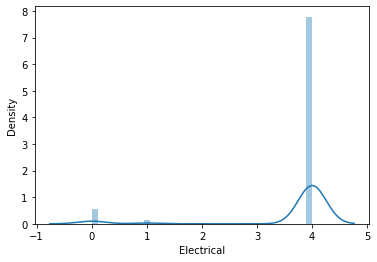

In [108]:
sns.distplot(df['Electrical'])

<AxesSubplot:xlabel='1stFlrSF', ylabel='Density'>

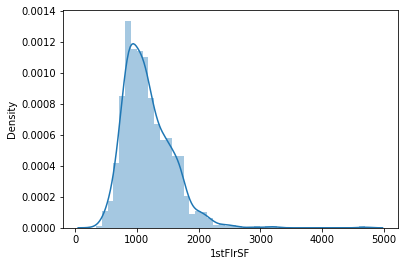

In [109]:
sns.distplot(df['1stFlrSF'])

<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

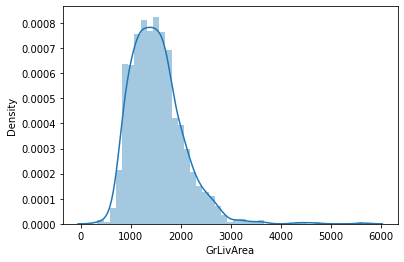

In [110]:
sns.distplot(df['GrLivArea'])

<AxesSubplot:xlabel='FullBath', ylabel='Density'>

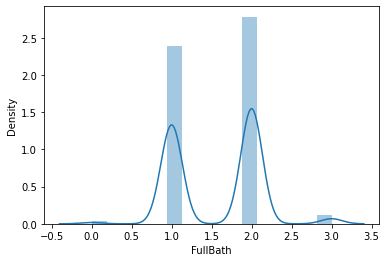

In [111]:
sns.distplot(df['FullBath'])

<AxesSubplot:xlabel='KitchenQual', ylabel='Density'>

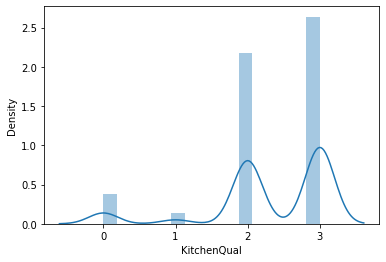

In [112]:
sns.distplot(df['KitchenQual'])

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

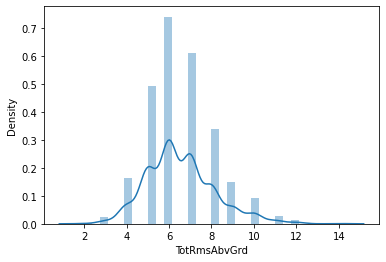

In [113]:
sns.distplot(df['TotRmsAbvGrd'])

<AxesSubplot:xlabel='Functional', ylabel='Density'>

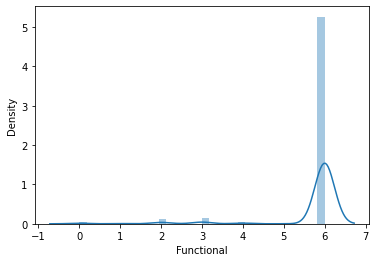

In [114]:
sns.distplot(df['Functional'])

<AxesSubplot:xlabel='Fireplaces', ylabel='Density'>

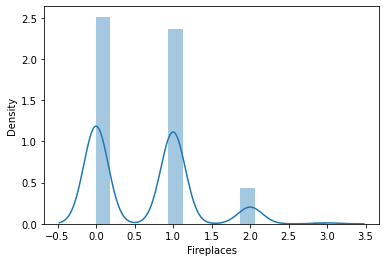

In [115]:
sns.distplot(df['Fireplaces'])

<AxesSubplot:xlabel='FireplaceQu', ylabel='Density'>

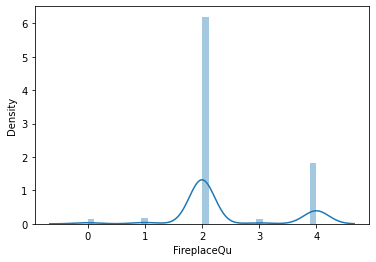

In [116]:
sns.distplot(df['FireplaceQu'])

<AxesSubplot:xlabel='GarageType', ylabel='Density'>

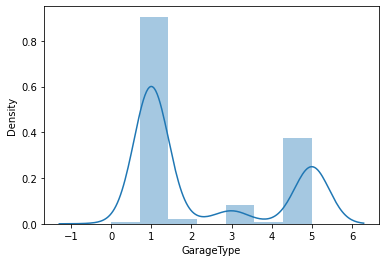

In [117]:
sns.distplot(df['GarageType'])

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

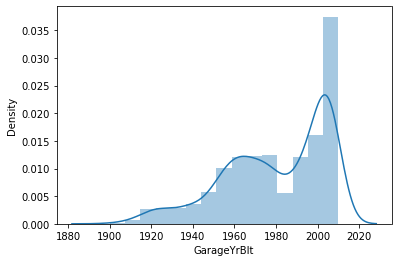

In [118]:
sns.distplot(df['GarageYrBlt'])

<AxesSubplot:xlabel='GarageFinish', ylabel='Density'>

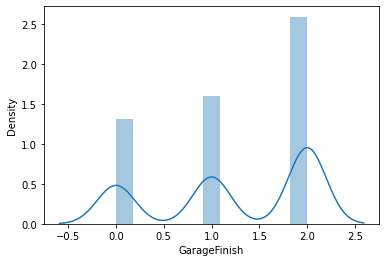

In [119]:
sns.distplot(df['GarageFinish'])

<AxesSubplot:xlabel='GarageCars', ylabel='Density'>

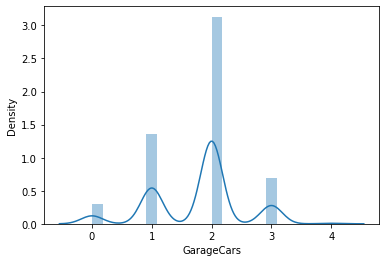

In [120]:
sns.distplot(df['GarageCars'])

<AxesSubplot:xlabel='GarageArea', ylabel='Density'>

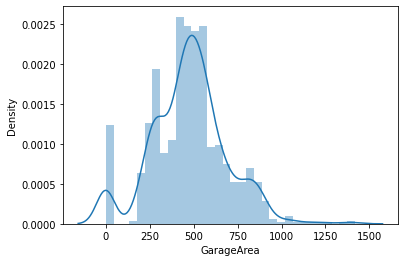

In [121]:
sns.distplot(df['GarageArea'])

<AxesSubplot:xlabel='GarageQual', ylabel='Density'>

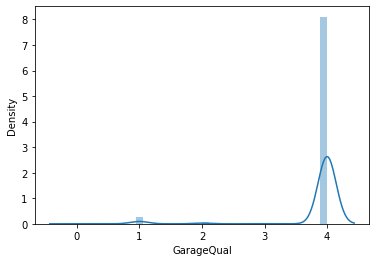

In [122]:
sns.distplot(df['GarageQual'])

<AxesSubplot:xlabel='GarageCond', ylabel='Density'>

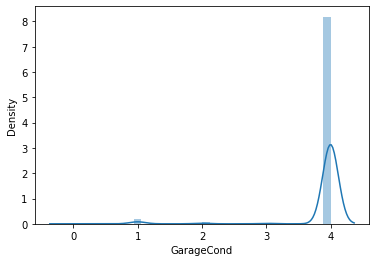

In [123]:
sns.distplot(df['GarageCond'])

<AxesSubplot:xlabel='PavedDrive', ylabel='Density'>

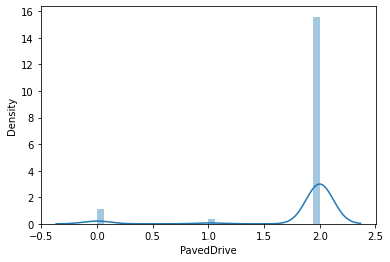

In [124]:
sns.distplot(df['PavedDrive'])

<AxesSubplot:xlabel='WoodDeckSF', ylabel='Density'>

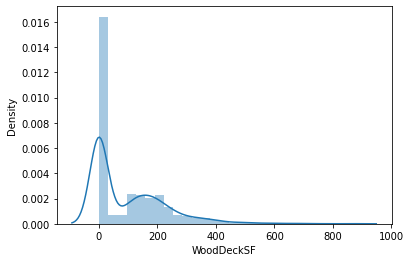

In [125]:
sns.distplot(df['WoodDeckSF'])

<AxesSubplot:xlabel='OpenPorchSF', ylabel='Density'>

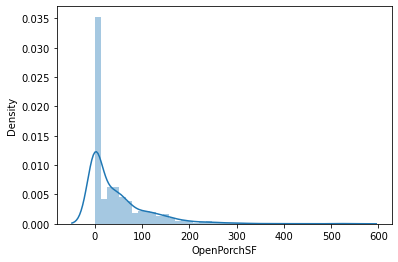

In [126]:
sns.distplot(df['OpenPorchSF'])

<AxesSubplot:xlabel='Fence', ylabel='Density'>

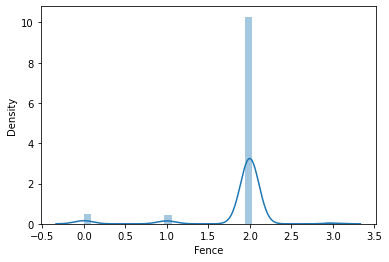

In [128]:
sns.distplot(df['Fence'])

<AxesSubplot:xlabel='MiscFeature', ylabel='Density'>

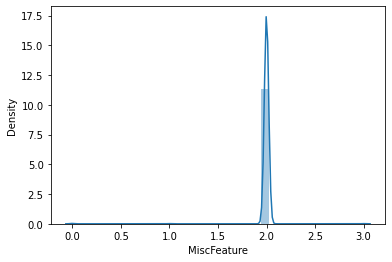

In [129]:
sns.distplot(df['MiscFeature'])

<AxesSubplot:xlabel='SaleType', ylabel='Density'>

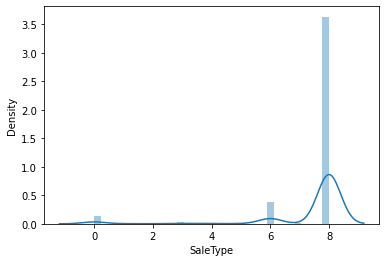

In [130]:
sns.distplot(df['SaleType'])

<AxesSubplot:xlabel='SaleCondition', ylabel='Density'>

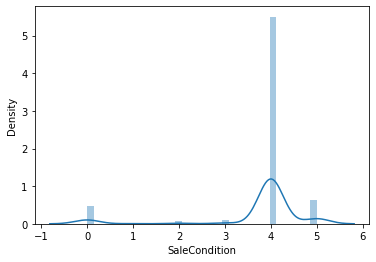

In [131]:
sns.distplot(df['SaleCondition'])

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

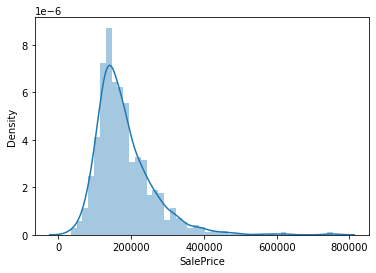

In [132]:
sns.distplot(df['SalePrice'])

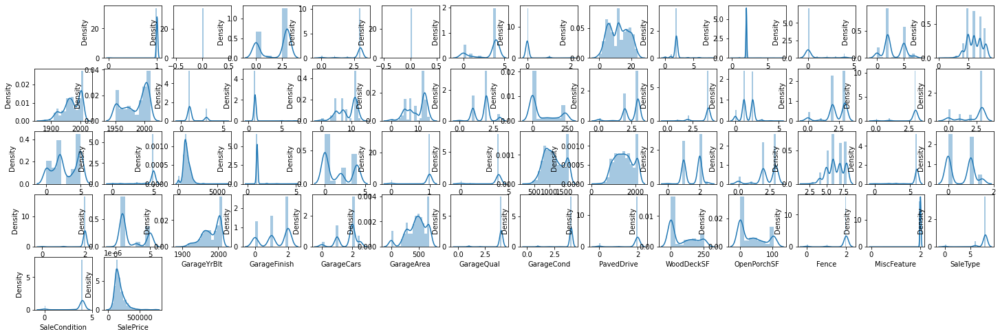

In [478]:
collist=df.columns.values
ncol=14
nrows=15
plt.figure(figsize=(25,25))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.distplot(df[collist[i]])

In [479]:
df.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', 'GrLivArea', 'FullBath', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

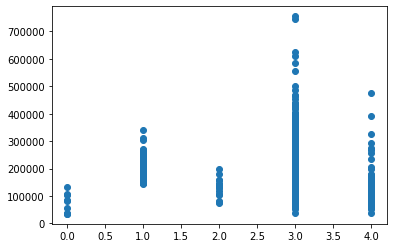

In [137]:
plt.scatter(df['MSZoning'],df['SalePrice'])

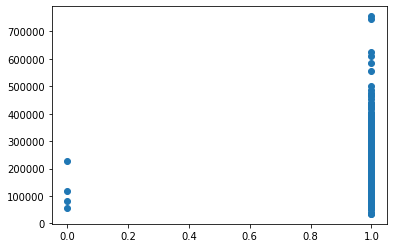

In [138]:
plt.scatter(df['Street'],df['SalePrice'])

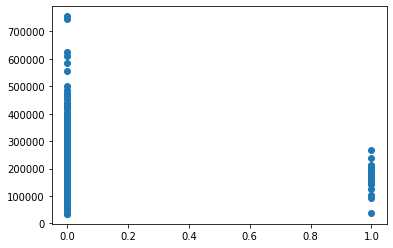

In [139]:
plt.scatter(df['Alley'],df['SalePrice'])

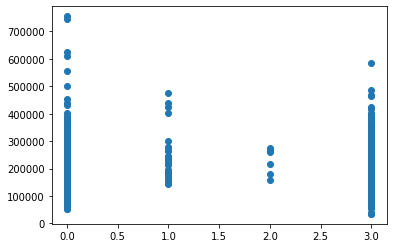

In [140]:
plt.scatter(df['LotShape'],df['SalePrice'])

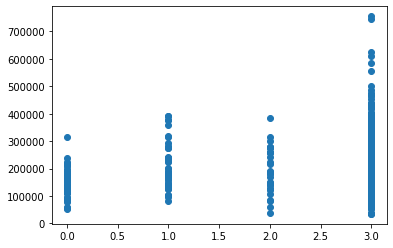

In [141]:
plt.scatter(df['LandContour'],df['SalePrice'])

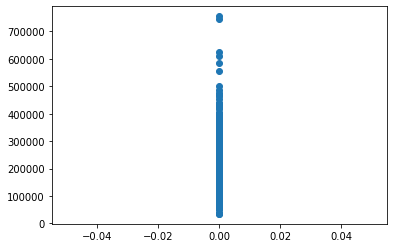

In [142]:
plt.scatter(df['Utilities'],df['SalePrice'])

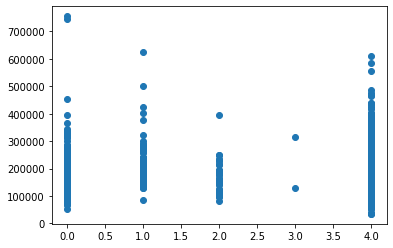

In [143]:
plt.scatter(df['LotConfig'],df['SalePrice'])

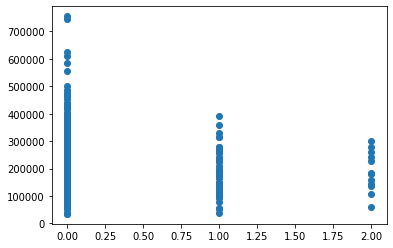

In [144]:
plt.scatter(df['LandSlope'],df['SalePrice'])

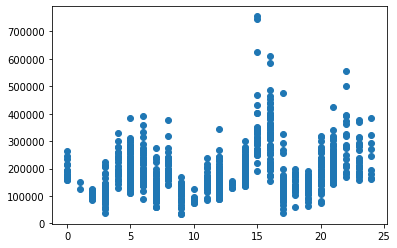

In [145]:
plt.scatter(df['Neighborhood'],df['SalePrice'])

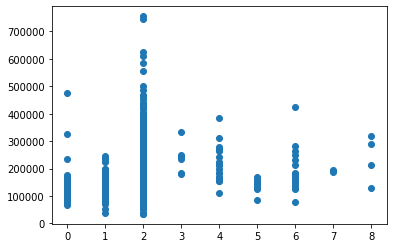

In [146]:
plt.scatter(df['Condition1'],df['SalePrice'])

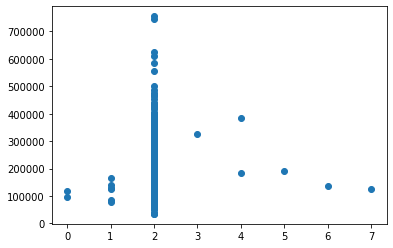

In [147]:
plt.scatter(df['Condition2'],df['SalePrice'])

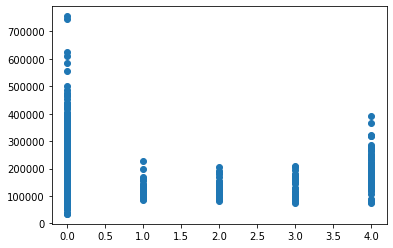

In [148]:
plt.scatter(df['BldgType'],df['SalePrice'])

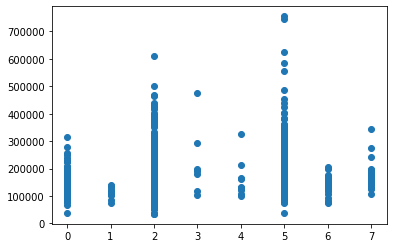

In [149]:
plt.scatter(df['HouseStyle'],df['SalePrice'])

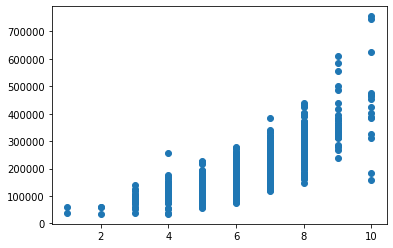

In [150]:
plt.scatter(df['OverallQual'],df['SalePrice'])

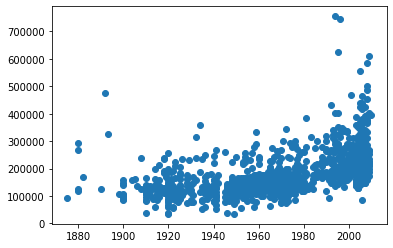

In [151]:
plt.scatter(df['YearBuilt'],df['SalePrice'])

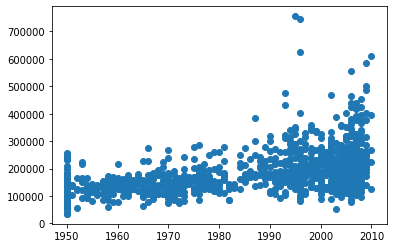

In [152]:
plt.scatter(df['YearRemodAdd'],df['SalePrice'])

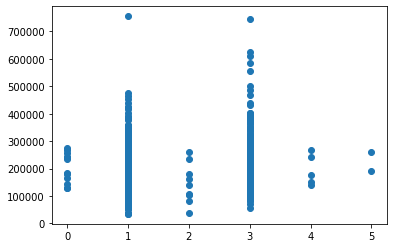

In [153]:
plt.scatter(df['RoofStyle'],df['SalePrice'])

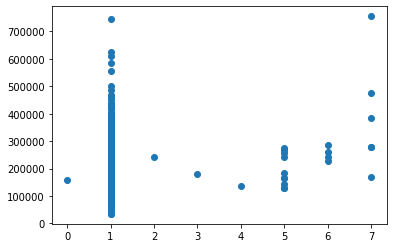

In [154]:
plt.scatter(df['RoofMatl'],df['SalePrice'])

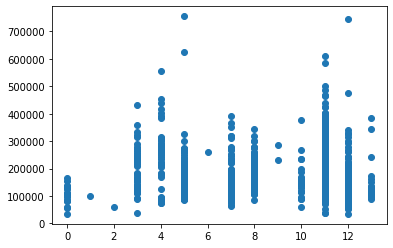

In [155]:
plt.scatter(df['Exterior1st'],df['SalePrice'])

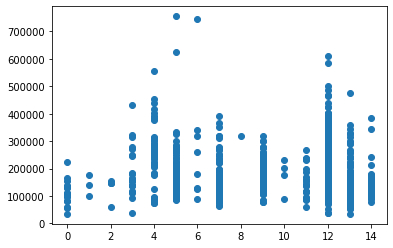

In [156]:
plt.scatter(df['Exterior2nd'],df['SalePrice'])

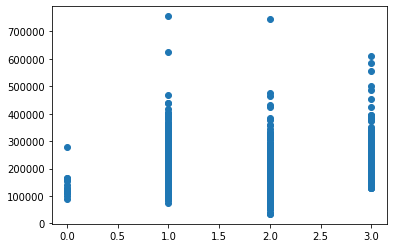

In [157]:
plt.scatter(df['MasVnrType'],df['SalePrice'])

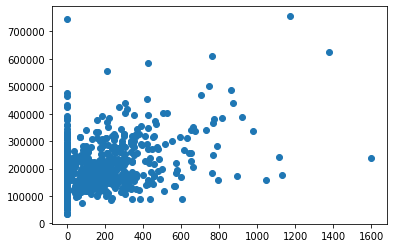

In [158]:
plt.scatter(df['MasVnrArea'],df['SalePrice'])

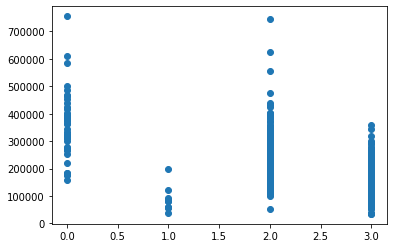

In [159]:
plt.scatter(df['ExterQual'],df['SalePrice'])

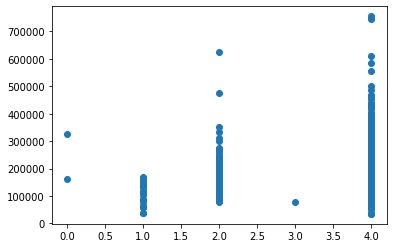

In [160]:
plt.scatter(df['ExterCond'],df['SalePrice'])

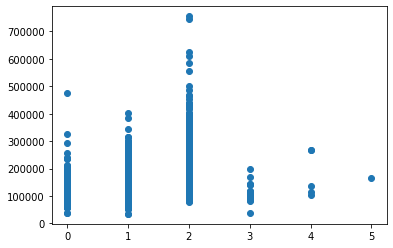

In [161]:
plt.scatter(df['Foundation'],df['SalePrice'])

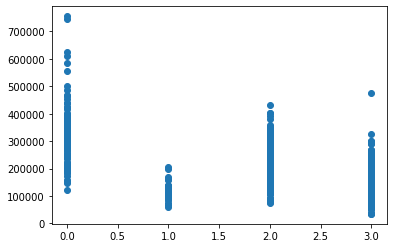

In [162]:
plt.scatter(df['BsmtQual'],df['SalePrice'])

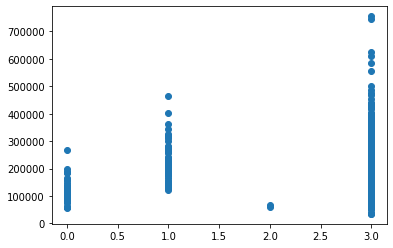

In [163]:
plt.scatter(df['BsmtCond'],df['SalePrice'])

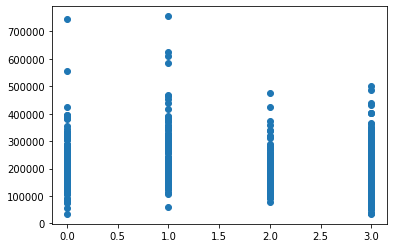

In [164]:
plt.scatter(df['BsmtExposure'],df['SalePrice'])

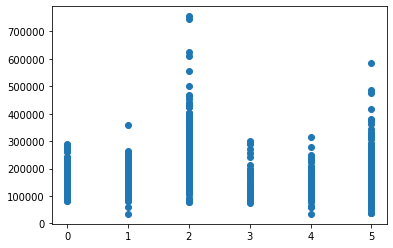

In [165]:
plt.scatter(df['BsmtFinType1'],df['SalePrice'])

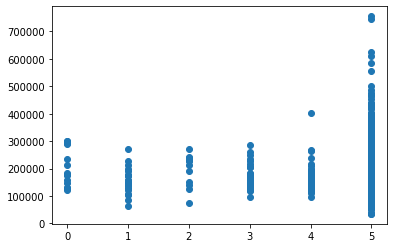

In [166]:
plt.scatter(df['BsmtFinType2'],df['SalePrice'])

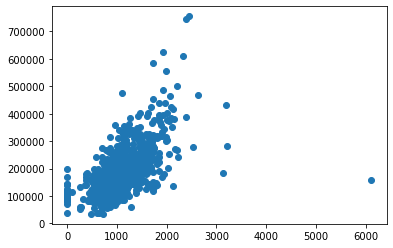

In [167]:
plt.scatter(df['TotalBsmtSF'],df['SalePrice'])

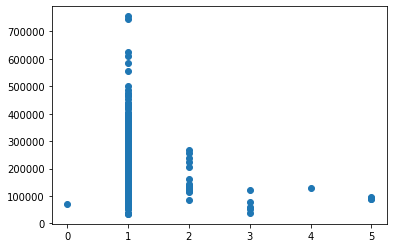

In [168]:
plt.scatter(df['Heating'],df['SalePrice'])

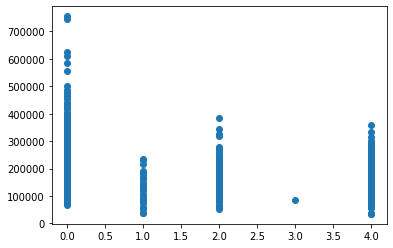

In [169]:
plt.scatter(df['HeatingQC'],df['SalePrice'])

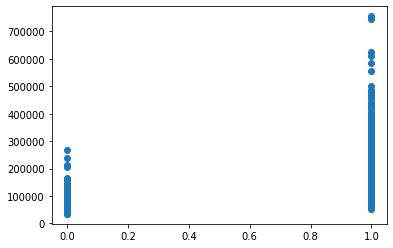

In [170]:
plt.scatter(df['CentralAir'],df['SalePrice'])

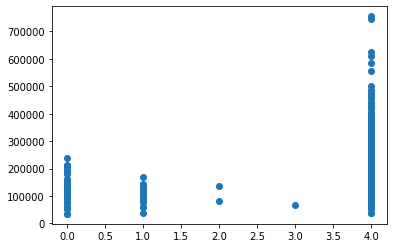

In [171]:
plt.scatter(df['Electrical'],df['SalePrice'])

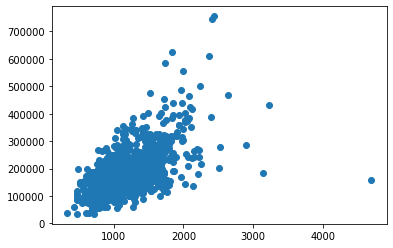

In [172]:
plt.scatter(df['1stFlrSF'],df['SalePrice'])

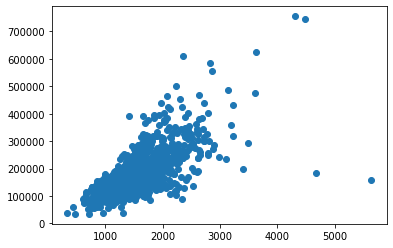

In [173]:
plt.scatter(df['GrLivArea'],df['SalePrice'])

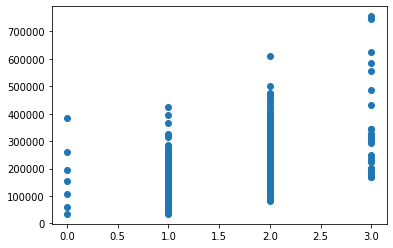

In [174]:
plt.scatter(df['FullBath'],df['SalePrice'])

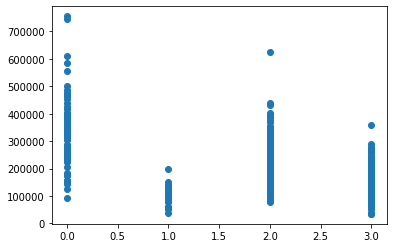

In [175]:
plt.scatter(df['KitchenQual'],df['SalePrice'])

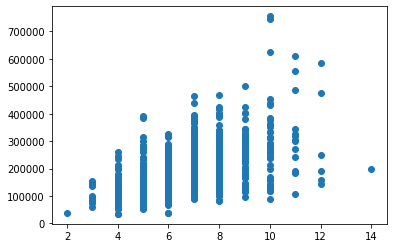

In [176]:
plt.scatter(df['TotRmsAbvGrd'],df['SalePrice'])

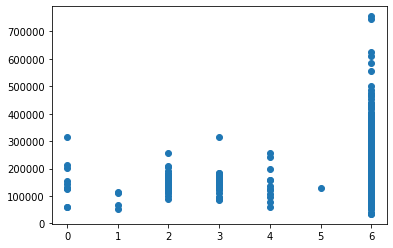

In [177]:
plt.scatter(df['Functional'],df['SalePrice'])

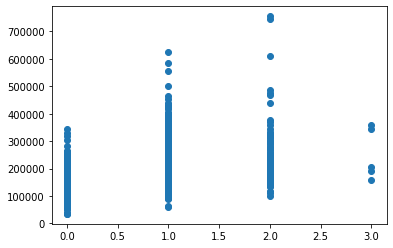

In [178]:
plt.scatter(df['Fireplaces'],df['SalePrice'])

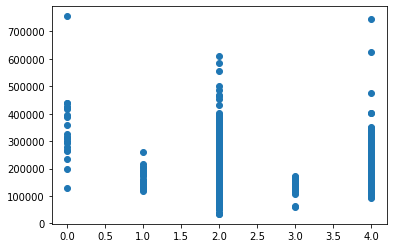

In [179]:
plt.scatter(df['FireplaceQu'],df['SalePrice'])

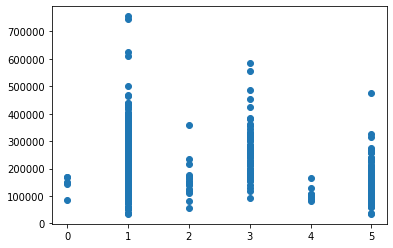

In [180]:
plt.scatter(df['GarageType'],df['SalePrice'])

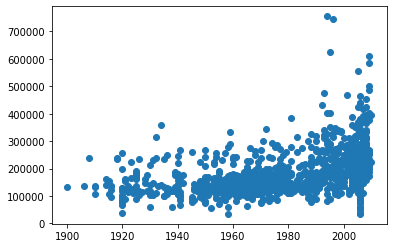

In [181]:
plt.scatter(df['GarageYrBlt'],df['SalePrice'])

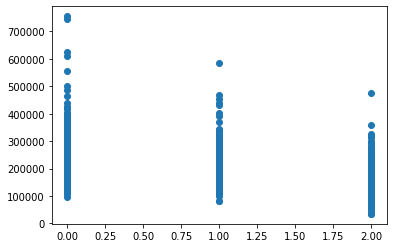

In [182]:
plt.scatter(df['GarageFinish'],df['SalePrice'])

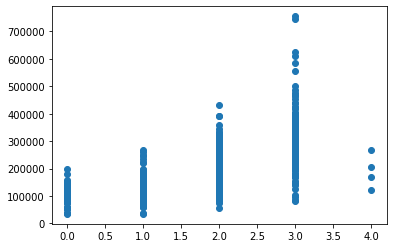

In [183]:
plt.scatter(df['GarageCars'],df['SalePrice'])

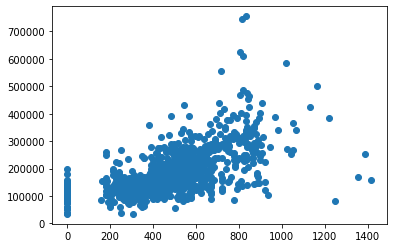

In [184]:
plt.scatter(df['GarageArea'],df['SalePrice'])

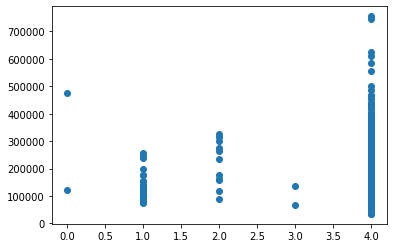

In [185]:
plt.scatter(df['GarageQual'],df['SalePrice'])

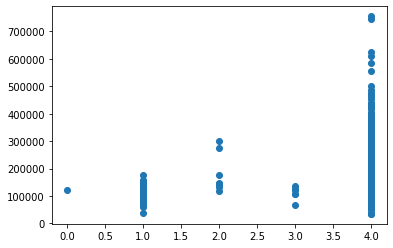

In [186]:
plt.scatter(df['GarageCond'],df['SalePrice'])

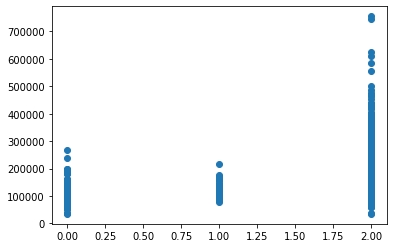

In [187]:
plt.scatter(df['PavedDrive'],df['SalePrice'])

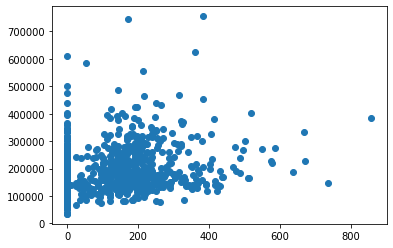

In [188]:
plt.scatter(df['WoodDeckSF'],df['SalePrice'])

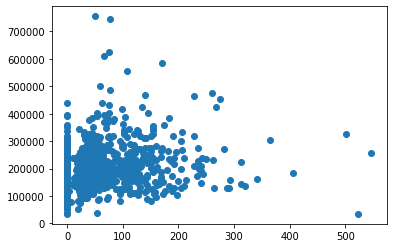

In [189]:
plt.scatter(df['OpenPorchSF'],df['SalePrice'])

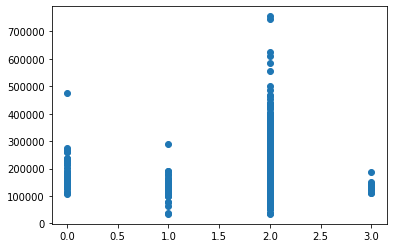

In [191]:
plt.scatter(df['Fence'],df['SalePrice'])

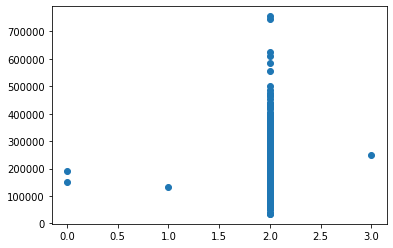

In [192]:
plt.scatter(df['MiscFeature'],df['SalePrice'])

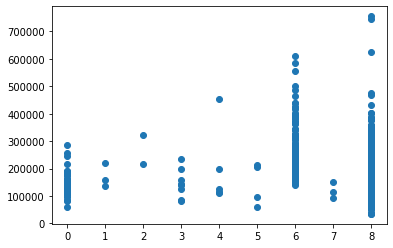

In [193]:
plt.scatter(df['SaleType'],df['SalePrice'])

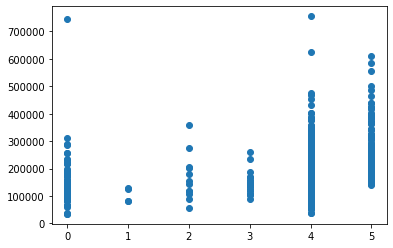

In [194]:
plt.scatter(df['SaleCondition'],df['SalePrice'])

<AxesSubplot:>

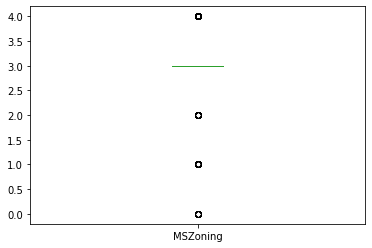

In [198]:
df['MSZoning'].plot.box()

<AxesSubplot:>

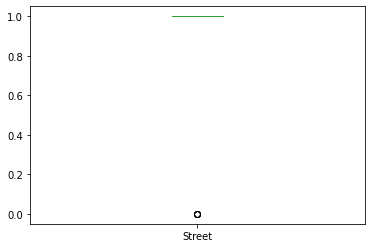

In [199]:
df['Street'].plot.box()

<AxesSubplot:>

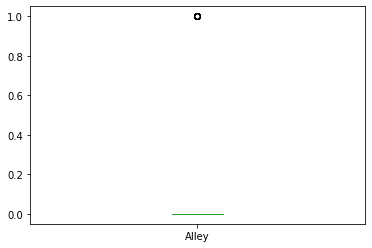

In [200]:
df['Alley'].plot.box()

<AxesSubplot:>

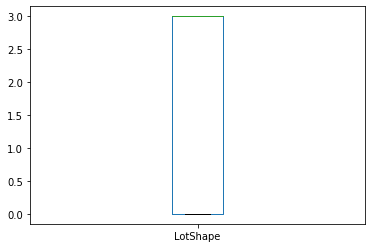

In [201]:
df['LotShape'].plot.box()

<AxesSubplot:>

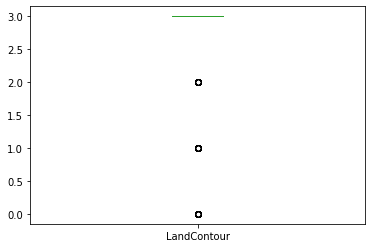

In [202]:
df['LandContour'].plot.box()

<AxesSubplot:>

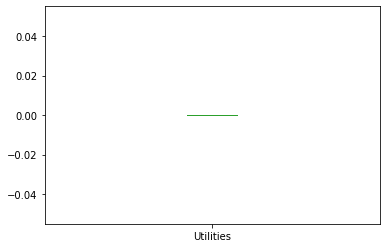

In [203]:
df['Utilities'].plot.box()

<AxesSubplot:>

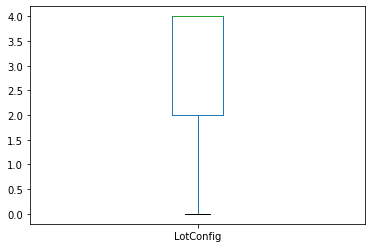

In [204]:
df['LotConfig'].plot.box()

<AxesSubplot:>

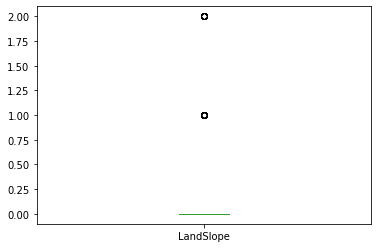

In [205]:
df['LandSlope'].plot.box()

<AxesSubplot:>

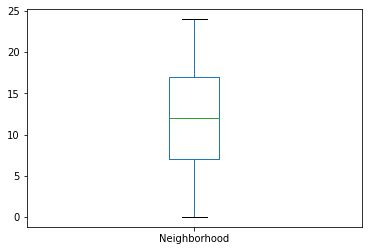

In [206]:
df['Neighborhood'].plot.box()

<AxesSubplot:>

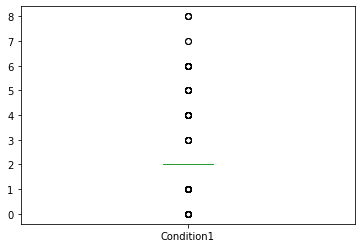

In [207]:
df['Condition1'].plot.box()

<AxesSubplot:>

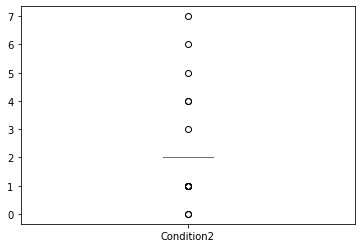

In [208]:
df['Condition2'].plot.box()

<AxesSubplot:>

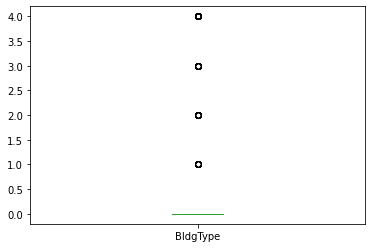

In [209]:
df['BldgType'].plot.box()

<AxesSubplot:>

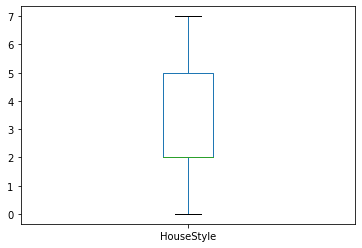

In [210]:
df['HouseStyle'].plot.box()

<AxesSubplot:>

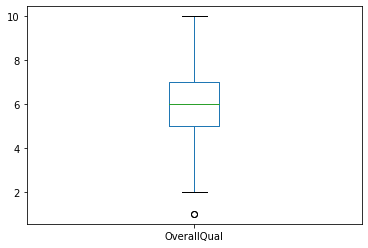

In [211]:
df['OverallQual'].plot.box()

<AxesSubplot:>

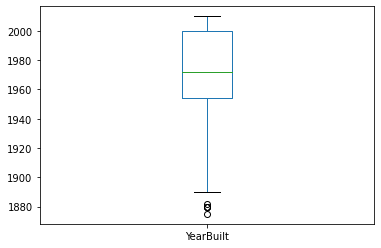

In [212]:
df['YearBuilt'].plot.box()

<AxesSubplot:>

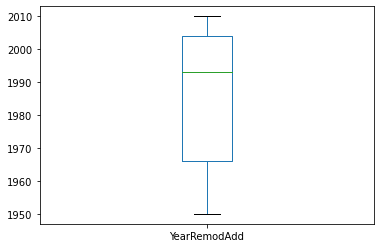

In [213]:
df['YearRemodAdd'].plot.box()

<AxesSubplot:>

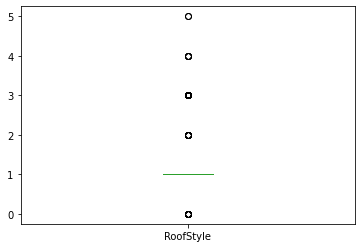

In [214]:
df['RoofStyle'].plot.box()

<AxesSubplot:>

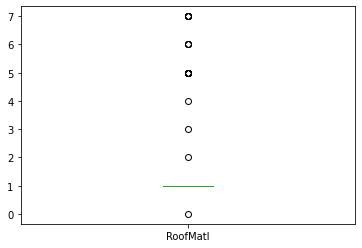

In [215]:
df['RoofMatl'].plot.box()

<AxesSubplot:>

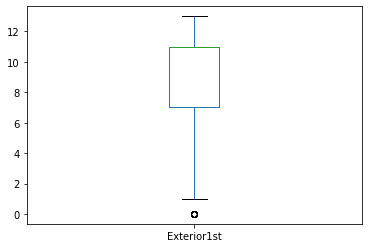

In [216]:
df['Exterior1st'].plot.box()

<AxesSubplot:>

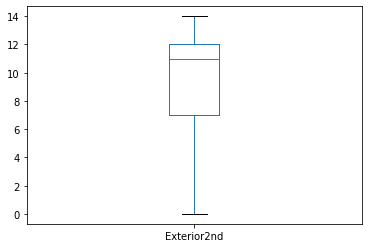

In [217]:
df['Exterior2nd'].plot.box()

<AxesSubplot:>

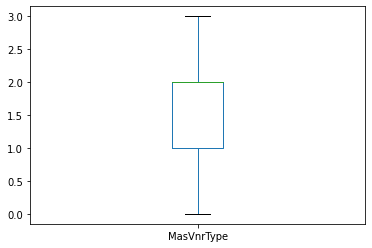

In [218]:
df['MasVnrType'].plot.box()

<AxesSubplot:>

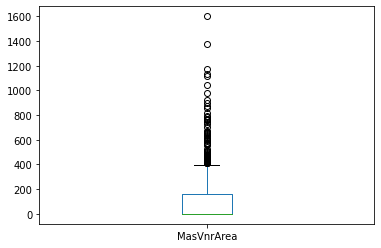

In [219]:
df['MasVnrArea'].plot.box()

<AxesSubplot:>

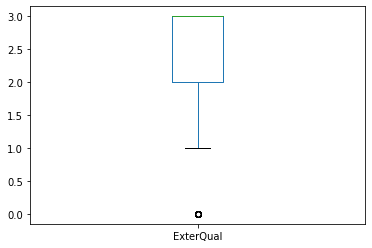

In [220]:
df['ExterQual'].plot.box()

<AxesSubplot:>

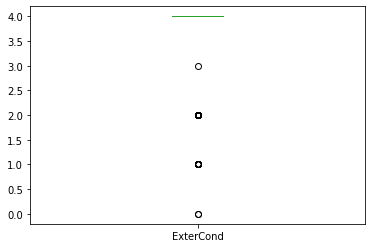

In [221]:
df['ExterCond'].plot.box()

<AxesSubplot:>

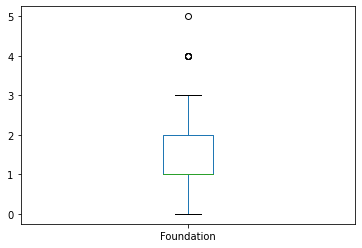

In [222]:
df['Foundation'].plot.box()

<AxesSubplot:>

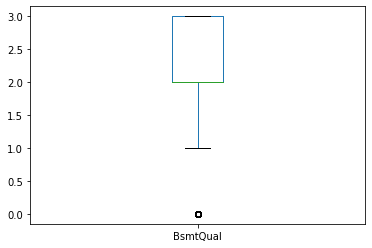

In [223]:
df['BsmtQual'].plot.box()

<AxesSubplot:>

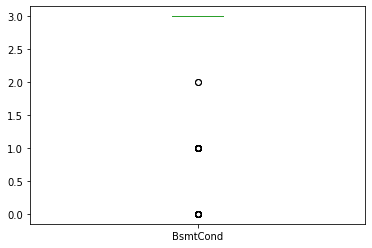

In [224]:
df['BsmtCond'].plot.box()

<AxesSubplot:>

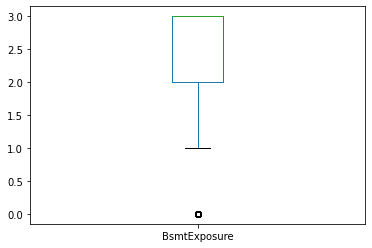

In [225]:
df['BsmtExposure'].plot.box()

<AxesSubplot:>

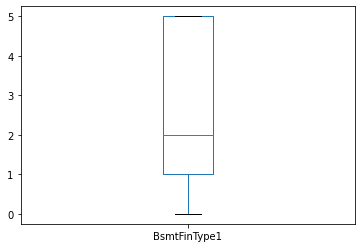

In [226]:
df['BsmtFinType1'].plot.box()

<AxesSubplot:>

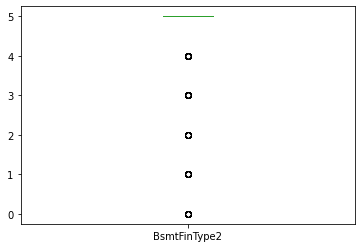

In [227]:
df['BsmtFinType2'].plot.box()

<AxesSubplot:>

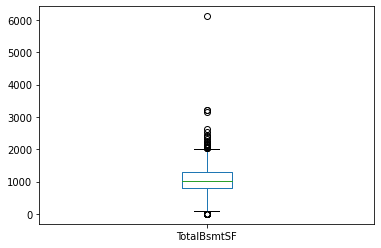

In [228]:
df['TotalBsmtSF'].plot.box()

<AxesSubplot:>

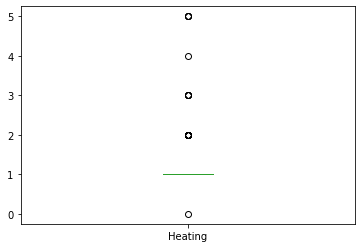

In [229]:
df['Heating'].plot.box()

<AxesSubplot:>

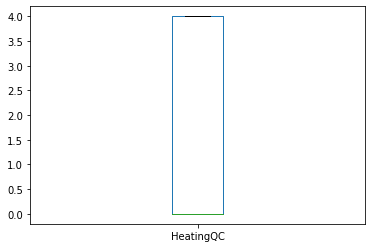

In [230]:
df['HeatingQC'].plot.box()

<AxesSubplot:>

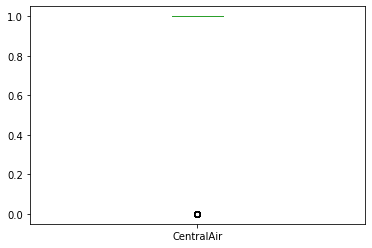

In [231]:
df['CentralAir'].plot.box()

<AxesSubplot:>

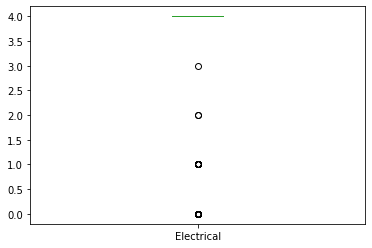

In [232]:
df['Electrical'].plot.box()

<AxesSubplot:>

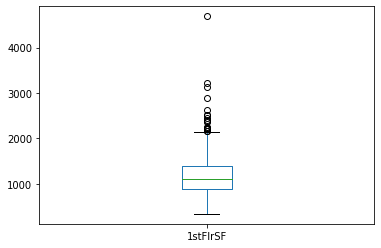

In [233]:
df['1stFlrSF'].plot.box()

<AxesSubplot:>

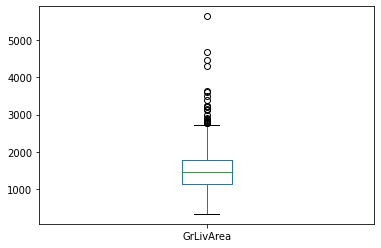

In [234]:
df['GrLivArea'].plot.box()

<AxesSubplot:>

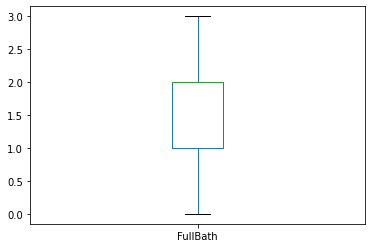

In [235]:
df['FullBath'].plot.box()

<AxesSubplot:>

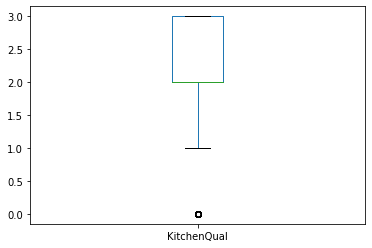

In [236]:
df['KitchenQual'].plot.box()

<AxesSubplot:>

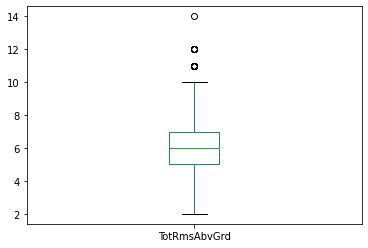

In [237]:
df['TotRmsAbvGrd'].plot.box()

<AxesSubplot:>

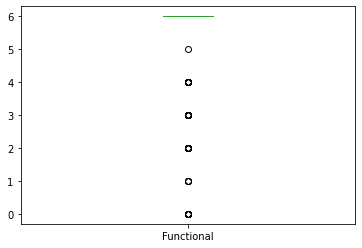

In [238]:
df['Functional'].plot.box()

<AxesSubplot:>

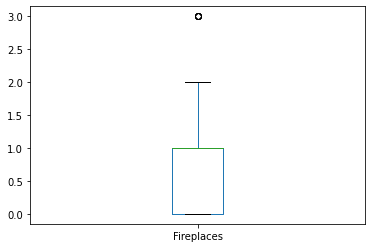

In [239]:
df['Fireplaces'].plot.box()

<AxesSubplot:>

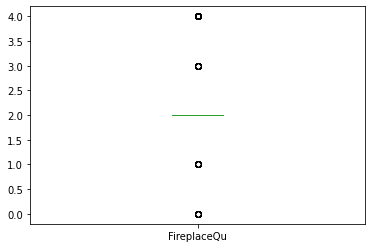

In [240]:
df['FireplaceQu'].plot.box()

<AxesSubplot:>

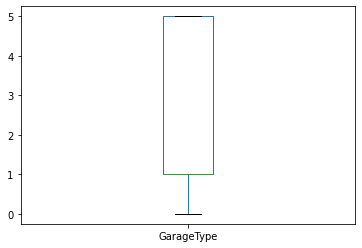

In [241]:
df['GarageType'].plot.box()

<AxesSubplot:>

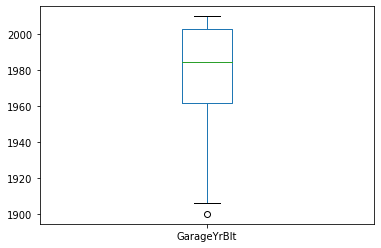

In [242]:
df['GarageYrBlt'].plot.box()

<AxesSubplot:>

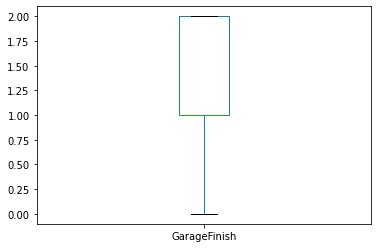

In [243]:
df['GarageFinish'].plot.box()

<AxesSubplot:>

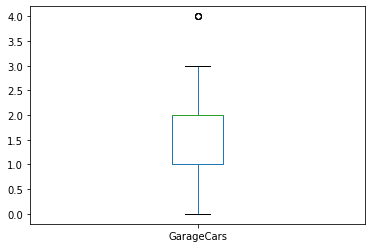

In [244]:
df['GarageCars'].plot.box()

<AxesSubplot:>

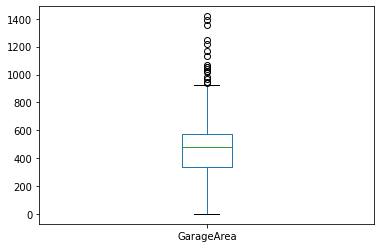

In [245]:
df['GarageArea'].plot.box()

<AxesSubplot:>

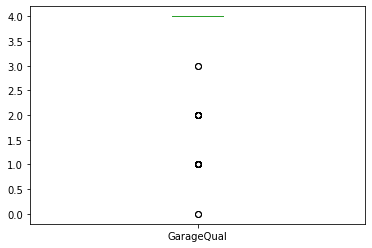

In [246]:
df['GarageQual'].plot.box()

<AxesSubplot:>

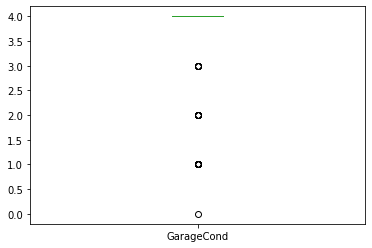

In [247]:
df['GarageCond'].plot.box()

<AxesSubplot:>

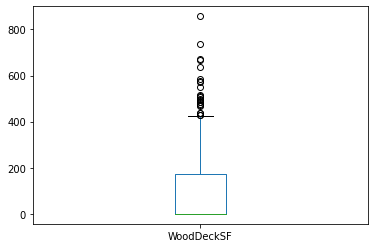

In [248]:
df['WoodDeckSF'].plot.box()

<AxesSubplot:>

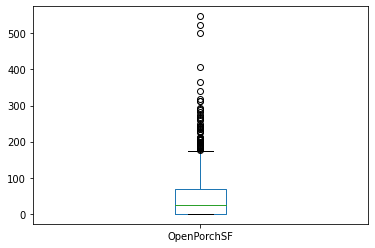

In [249]:
df['OpenPorchSF'].plot.box()

<AxesSubplot:>

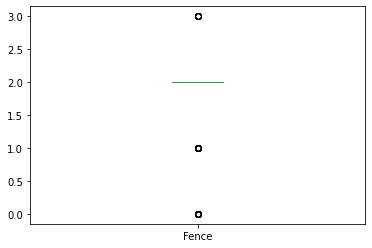

In [251]:
df['Fence'].plot.box()

<AxesSubplot:>

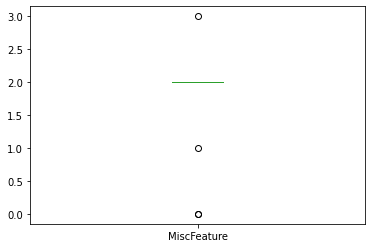

In [252]:
df['MiscFeature'].plot.box()

<AxesSubplot:>

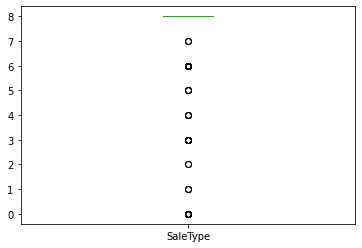

In [253]:
df['SaleType'].plot.box()

<AxesSubplot:>

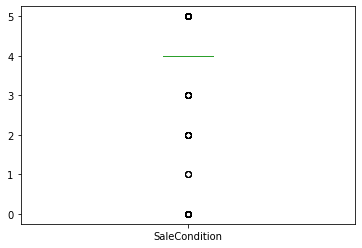

In [254]:
df['SaleCondition'].plot.box()

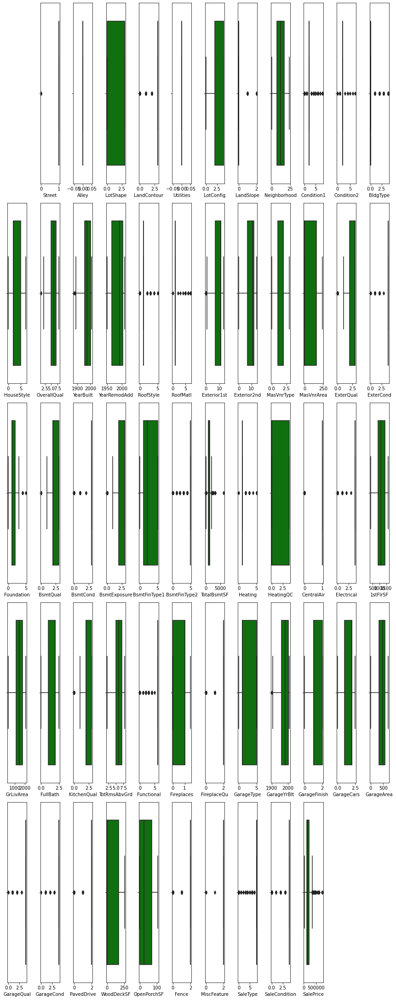

In [482]:
collist=df.columns.values
ncol=12
nrows=10
plt.figure(figsize=(ncol,5*ncol))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='green',orient='v')
    plt.tight_layout()

In [ ]:
#sns.pairplot(df)

# Removing Outliers

In [256]:
def outlier_IQR(df,feature_name):
    IQR=df[feature_name].quantile(0.75)-df[feature_name].quantile(0.25)
    lower=df[feature_name].quantile(0.25)-(IQR*1.5)
    upper=df[feature_name].quantile(0.25)+(IQR*1.5)
    return (lower,upper)

In [483]:
df.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', 'GrLivArea', 'FullBath', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

In [290]:
outlier_IQR(df,'OverallQual')

(2.0, 8.0)

In [295]:
df['OverallQual'].describe()

count    1168.000000
mean        6.104452
std         1.390153
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: OverallQual, dtype: float64

In [296]:
df.loc[df['OverallQual']>=8.0,'OverallQual']=8.0

In [297]:
df[df['OverallQual']>=8.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81,207,2,2,2,8,4,268000
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
30,3,1,0,3,3,0,4,0,16,2,...,4,2,196,82,2,2,2,8,4,319900
50,3,1,0,3,3,0,4,0,23,2,...,4,2,270,78,2,2,2,8,4,312500
55,3,1,0,3,3,0,4,0,5,2,...,4,2,171,159,2,2,2,8,4,230000
59,3,1,0,0,3,0,0,0,5,2,...,4,2,288,136,2,2,2,8,4,239000
65,3,1,0,3,3,0,4,0,16,2,...,4,2,184,0,2,2,2,8,4,350000
71,3,1,0,3,3,0,4,0,21,2,...,4,2,168,130,2,2,2,6,5,225000
75,3,1,0,3,3,0,4,0,5,2,...,4,2,208,44,2,2,2,8,4,297000
78,3,1,0,3,3,0,4,0,16,2,...,4,2,216,229,2,2,2,6,5,465000


In [302]:
outlier_IQR(df,'YearBuilt')

(1885.0, 2023.0)

In [303]:
df['YearBuilt'].describe()

count    1168.000000
mean     1970.930651
std        30.145255
min      1875.000000
25%      1954.000000
50%      1972.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64

In [307]:
df.loc[df['YearBuilt']>=2023.0,'YearBuilt']=2023.0

In [308]:
df[df['YearBuilt']>=2023.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice


In [310]:
outlier_IQR(df,'YearRemodAdd')

(1909.0, 2023.0)

In [315]:
df['YearRemodAdd'].describe()

count    1168.000000
mean     1984.758562
std        20.785185
min      1950.000000
25%      1966.000000
50%      1993.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64

In [312]:
df.loc[df['YearRemodAdd']>=2023,'YearRemodAdd']=2023

In [313]:
df[df['YearRemodAdd']>=2023]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice


In [316]:
outlier_IQR(df,'MasVnrArea')

(-240.0, 240.0)

In [317]:
df['MasVnrArea'].describe()

count    1168.000000
mean      101.696918
std       182.218483
min         0.000000
25%         0.000000
50%         0.000000
75%       160.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [318]:
df.loc[df['MasVnrArea']>=240,'MasVnrArea']=240

In [319]:
df[df['MasVnrArea']>=240]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0,122,2,2,2,0,4,190000
19,3,1,0,3,3,0,4,0,2,2,...,4,2,0,0,2,2,2,8,4,106000
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
30,3,1,0,3,3,0,4,0,16,2,...,4,2,196,82,2,2,2,8,4,319900
50,3,1,0,3,3,0,4,0,23,2,...,4,2,270,78,2,2,2,8,4,312500
55,3,1,0,3,3,0,4,0,5,2,...,4,2,171,159,2,2,2,8,4,230000
56,3,1,0,3,3,0,4,0,12,3,...,4,2,301,0,2,2,2,8,4,180000
63,3,1,0,3,3,0,4,0,20,2,...,4,2,0,84,2,2,2,8,4,228500
75,3,1,0,3,3,0,4,0,5,2,...,4,2,208,44,2,2,2,8,4,297000
91,3,1,0,3,3,0,4,0,5,2,...,4,2,0,45,2,2,2,8,4,287000


In [325]:
outlier_IQR(df,'TotalBsmtSF')

(60.25, 1537.75)

In [326]:
df['TotalBsmtSF'].describe()

count    1168.000000
mean     1061.095034
std       442.272249
min         0.000000
25%       799.000000
50%      1005.500000
75%      1291.500000
max      6110.000000
Name: TotalBsmtSF, dtype: float64

In [327]:
outlier_IQR(df,'1stFlrSF')

(142.0, 1642.0)

In [328]:
df.loc[df['1stFlrSF']>=1642.0,'1stFlrSF']=1642.0

In [330]:
df[df['1stFlrSF']>=1642.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81,207,2,2,2,8,4,268000
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0,122,2,2,2,0,4,190000
7,3,1,0,3,3,0,0,0,19,2,...,4,2,0,0,2,0,2,8,4,155000
25,3,1,0,3,0,0,0,0,6,2,...,4,2,166,120,2,2,2,0,0,217000
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
30,3,1,0,3,3,0,4,0,16,2,...,4,2,196,82,2,2,2,8,4,319900
37,3,1,0,3,3,0,0,0,7,2,...,4,2,0,29,2,2,2,8,4,243000
40,3,1,0,0,3,0,0,0,12,2,...,4,1,210,62,2,2,2,8,4,215000
50,3,1,0,3,3,0,4,0,23,2,...,4,2,270,78,2,2,2,8,4,312500
55,3,1,0,3,3,0,4,0,5,2,...,4,2,171,159,2,2,2,8,4,230000


In [333]:
outlier_IQR(df,'GrLivArea')

(165.625, 2120.875)

In [334]:
df['GrLivArea'].describe()

count    1168.000000
mean     1525.066781
std       528.042957
min       334.000000
25%      1143.250000
50%      1468.500000
75%      1795.000000
max      5642.000000
Name: GrLivArea, dtype: float64

In [336]:
df.loc[df['GrLivArea']>=2120.875,'GrLivArea']=2120.875

In [337]:
df[df['GrLivArea']>=2120.875]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81,207,2,2,2,8,4,268000
25,3,1,0,3,0,0,0,0,6,2,...,4,2,166,120,2,2,2,0,0,217000
32,3,1,0,0,3,0,4,0,19,1,...,4,0,155,24,2,2,0,8,4,190000
34,3,1,0,1,3,0,0,0,8,1,...,4,1,120,144,2,2,2,8,4,169000
37,3,1,0,3,3,0,0,0,7,2,...,4,2,0,29,2,2,2,8,4,243000
51,3,1,0,3,3,0,0,0,17,2,...,4,2,0,547,2,2,2,8,4,256000
56,3,1,0,3,3,0,4,0,12,3,...,4,2,301,0,2,2,2,8,4,180000
65,3,1,0,3,3,0,4,0,16,2,...,4,2,184,0,2,2,2,8,4,350000
68,3,1,0,0,3,0,1,0,6,2,...,4,2,0,0,2,2,2,8,2,200624
91,3,1,0,3,3,0,4,0,5,2,...,4,2,0,45,2,2,2,8,4,287000


In [338]:
outlier_IQR(df,'FullBath')

(-0.5, 2.5)

In [339]:
df.loc[df['FullBath']>=2.5,'FullBath']=2.5

In [340]:
df[df['FullBath']>=2.5]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
68,3,1,0,0,3,0,1,0,6,2,...,4,2,0,0,2,2,2,8,2,200624
141,3,1,0,0,3,0,0,0,15,2,...,4,2,171,78,0,2,2,8,0,745000
192,3,1,0,3,3,0,4,0,17,2,...,4,2,302,0,2,2,2,8,4,295000
193,3,1,0,0,3,0,4,0,16,2,...,4,2,147,21,2,2,2,6,5,345000
232,3,1,0,3,3,0,4,0,16,2,...,4,2,144,78,2,2,2,6,5,485000
270,3,1,0,0,3,0,0,0,16,2,...,4,2,240,154,2,2,2,6,5,325300
273,3,1,0,3,3,0,0,0,20,2,...,4,2,367,0,2,2,2,8,4,320000
287,3,1,0,3,3,0,4,0,14,2,...,4,2,268,112,2,2,2,8,0,178000
300,3,1,0,0,3,0,4,0,22,2,...,4,2,214,108,2,2,2,6,5,556581
305,3,1,0,0,3,0,4,0,15,2,...,4,2,264,75,2,2,2,8,4,430000


In [346]:
outlier_IQR(df,'TotRmsAbvGrd')

(2.0, 8.0)

In [347]:
df.loc[df['TotRmsAbvGrd']>=8.0,'TotRmsAbvGrd']=8.0

In [348]:
df[df['TotRmsAbvGrd']>=8.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81,207,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180,130,2,2,2,8,4,269790
4,3,1,0,0,3,0,2,0,14,2,...,4,2,240,0,2,2,2,8,4,215000
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100,17,2,2,2,6,5,219210
7,3,1,0,3,3,0,0,0,19,2,...,4,2,0,0,2,0,2,8,4,155000
14,3,1,0,0,3,0,4,0,7,2,...,4,2,121,0,2,2,2,8,4,135500
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
32,3,1,0,0,3,0,4,0,19,1,...,4,0,155,24,2,2,0,8,4,190000
51,3,1,0,3,3,0,0,0,17,2,...,4,2,0,547,2,2,2,8,4,256000
57,3,1,0,0,3,0,4,0,15,2,...,4,2,240,39,2,2,2,8,4,190000


In [351]:
outlier_IQR(df,'Functional')

(6.0, 6.0)

In [353]:
df['Functional'].describe()

count    1168.000000
mean        5.742295
std         0.987250
min         0.000000
25%         6.000000
50%         6.000000
75%         6.000000
max         6.000000
Name: Functional, dtype: float64

In [355]:
outlier_IQR(df,'Fireplaces')

(-1.5, 1.5)

In [356]:
df['Fireplaces'].describe()

count    1168.000000
mean        0.617295
std         0.650575
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64

In [357]:
df.loc[df['Fireplaces']>=1.5,'Fireplaces']=1.5

In [358]:
df[df['Fireplaces']>=1.5]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
15,3,1,0,3,3,0,4,0,6,2,...,4,2,96,0,2,2,2,8,4,165000
25,3,1,0,3,0,0,0,0,6,2,...,4,2,166,120,2,2,2,0,0,217000
31,3,1,0,3,1,0,4,0,17,2,...,4,1,0,0,2,2,2,8,4,135000
40,3,1,0,0,3,0,0,0,12,2,...,4,1,210,62,2,2,2,8,4,215000
51,3,1,0,3,3,0,0,0,17,2,...,4,2,0,547,2,2,2,8,4,256000
68,3,1,0,0,3,0,1,0,6,2,...,4,2,0,0,2,2,2,8,2,200624
96,2,1,0,3,3,0,4,0,20,1,...,4,2,0,0,2,2,2,8,4,144000
103,3,1,0,1,3,0,4,0,17,0,...,4,2,0,260,2,0,2,8,4,475000
106,3,1,0,3,3,0,4,0,12,2,...,4,2,0,42,2,2,2,8,4,205000
113,3,1,0,1,2,0,1,2,4,2,...,4,2,380,48,2,2,2,8,4,302000


In [361]:
outlier_IQR(df,'FireplaceQu')

(2.0, 2.0)

In [362]:
df['FireplaceQu'].describe()

count    1168.000000
mean        2.389555
std         0.905923
min         0.000000
25%         2.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: FireplaceQu, dtype: float64

In [363]:
df.loc[df['FireplaceQu']>=2.0,'FireplaceQu']=2.0

In [364]:
df[df['FireplaceQu']>=2.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,2,0,205,2,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81,207,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180,130,2,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0,122,2,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,2,240,0,2,2,2,8,4,215000
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100,17,2,2,2,6,5,219210
6,3,1,0,0,3,0,4,0,19,2,...,4,2,0,0,2,2,2,8,4,121500
7,3,1,0,3,3,0,0,0,19,2,...,4,2,0,0,2,0,2,8,4,155000
8,3,1,0,3,3,0,0,0,7,1,...,1,2,0,0,2,0,2,8,4,140000
9,3,1,0,3,3,0,4,0,12,2,...,4,2,158,0,2,2,2,0,0,118500


In [374]:
outlier_IQR(df,'GarageCars')

(-0.5, 2.5)

In [375]:
df['GarageCars'].describe()

count    1168.000000
mean        1.776541
std         0.745554
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: GarageCars, dtype: float64

In [376]:
df.loc[df['GarageCars']>=2.5,'GarageCars']=2.5

In [377]:
df[df['GarageCars']>=2.5]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100,17,2,2,2,6,5,219210
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
50,3,1,0,3,3,0,4,0,23,2,...,4,2,270,78,2,2,2,8,4,312500
65,3,1,0,3,3,0,4,0,16,2,...,4,2,184,0,2,2,2,8,4,350000
75,3,1,0,3,3,0,4,0,5,2,...,4,2,208,44,2,2,2,8,4,297000
78,3,1,0,3,3,0,4,0,16,2,...,4,2,216,229,2,2,2,6,5,465000
103,3,1,0,1,3,0,4,0,17,0,...,4,2,0,260,2,0,2,8,4,475000
104,3,1,0,0,3,0,4,0,16,2,...,4,2,0,102,2,2,2,8,4,335000
119,3,1,0,0,2,0,4,0,24,2,...,4,2,857,72,2,2,2,8,4,385000
121,3,1,0,3,3,0,4,0,12,2,...,4,2,0,0,2,1,2,8,4,123000


In [379]:
outlier_IQR(df,'GarageArea')

(-19.0, 695.0)

In [380]:
df['GarageArea'].describe()

count    1168.000000
mean      476.860445
std       214.466769
min         0.000000
25%       338.000000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64

In [381]:
df.loc[df['GarageArea']>=695.0,'GarageArea']=695.0

In [382]:
df[df['GarageArea']>=695.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
24,3,1,0,3,3,0,0,0,12,1,...,4,2,0,64,2,2,2,8,4,146000
27,3,1,0,3,3,0,0,0,22,2,...,4,2,113,0,2,2,2,6,5,394432
50,3,1,0,3,3,0,4,0,23,2,...,4,2,270,78,2,2,2,8,4,312500
53,3,1,0,0,3,0,4,0,12,2,...,4,2,0,0,2,2,2,8,4,153000
59,3,1,0,0,3,0,0,0,5,2,...,4,2,288,136,2,2,2,8,4,239000
65,3,1,0,3,3,0,4,0,16,2,...,4,2,184,0,2,2,2,8,4,350000
75,3,1,0,3,3,0,4,0,5,2,...,4,2,208,44,2,2,2,8,4,297000
78,3,1,0,3,3,0,4,0,16,2,...,4,2,216,229,2,2,2,6,5,465000
91,3,1,0,3,3,0,4,0,5,2,...,4,2,0,45,2,2,2,8,4,287000
98,3,1,0,3,3,0,4,0,12,2,...,4,2,0,80,2,3,2,8,0,150000


In [386]:
df['WoodDeckSF'].describe()

count    1168.000000
mean       96.206336
std       126.158988
min         0.000000
25%         0.000000
50%         0.000000
75%       171.000000
max       857.000000
Name: WoodDeckSF, dtype: float64

In [387]:
outlier_IQR(df,'WoodDeckSF')

(-256.5, 256.5)

In [388]:
df['WoodDeckSF'].describe()

count    1168.000000
mean       96.206336
std       126.158988
min         0.000000
25%         0.000000
50%         0.000000
75%       171.000000
max       857.000000
Name: WoodDeckSF, dtype: float64

In [389]:
df.loc[df['WoodDeckSF']>=256.5,'WoodDeckSF']=256.5

In [390]:
df[df['WoodDeckSF']>=256.5]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
18,3,1,0,0,3,0,0,0,7,2,...,2,2,256.5,30,2,0,2,8,4,148000
22,3,1,0,3,3,0,4,0,12,2,...,4,2,256.5,0,2,2,2,8,4,142125
41,3,1,0,3,3,0,4,0,12,2,...,4,2,256.5,0,2,2,2,8,4,132000
50,3,1,0,3,3,0,4,0,23,2,...,4,2,256.5,78,2,2,2,8,4,312500
56,3,1,0,3,3,0,4,0,12,3,...,4,2,256.5,0,2,2,2,8,4,180000
59,3,1,0,0,3,0,0,0,5,2,...,4,2,256.5,136,2,2,2,8,4,239000
79,3,1,0,2,2,0,4,0,20,2,...,4,2,256.5,25,2,2,2,8,4,215000
80,3,1,0,0,3,0,4,0,5,2,...,4,2,256.5,33,2,2,2,6,5,204900
92,3,1,0,3,3,0,4,0,5,2,...,4,2,256.5,0,2,2,2,8,4,144000
94,3,1,0,0,3,0,4,1,11,2,...,4,2,256.5,189,2,2,2,8,4,172000


In [391]:
df['OpenPorchSF'].describe()

count    1168.000000
mean       46.559932
std        66.381023
min         0.000000
25%         0.000000
50%        24.000000
75%        70.000000
max       547.000000
Name: OpenPorchSF, dtype: float64

In [392]:
outlier_IQR(df,'OpenPorchSF')

(-105.0, 105.0)

In [393]:
df.loc[df['OpenPorchSF']>=105.0,'OpenPorchSF']=105.0

In [394]:
df[df['OpenPorchSF']>=105.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,2,0.0,105,2,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81.0,105,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180.0,105,2,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0.0,105,2,2,2,0,4,190000
12,3,1,0,0,3,0,4,0,11,2,...,4,2,100.0,105,2,2,2,8,4,201000
23,3,1,0,0,3,0,4,0,12,2,...,4,2,0.0,105,2,2,2,0,4,136500
25,3,1,0,3,0,0,0,0,6,2,...,4,2,166.0,105,2,2,2,0,0,217000
34,3,1,0,1,3,0,0,0,8,1,...,4,1,120.0,105,2,2,2,8,4,169000
42,1,1,0,3,3,0,4,0,21,2,...,4,2,0.0,105,2,2,2,8,0,144152
51,3,1,0,3,3,0,0,0,17,2,...,4,2,0.0,105,2,2,2,8,4,256000


In [396]:
df['Fence'].describe()

count    1168.000000
mean        1.880993
std         0.457685
min         0.000000
25%         2.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: Fence, dtype: float64

In [397]:
outlier_IQR(df,'Fence')

(2.0, 2.0)

In [398]:
df.loc[df['Fence']>=2.0,'Fence']=2.0

In [399]:
df[df['Fence']>=2.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,2,0.0,105,2,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81.0,105,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180.0,105,2,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0.0,105,2,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,2,240.0,0,2,2,2,8,4,215000
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100.0,17,2,2,2,6,5,219210
6,3,1,0,0,3,0,4,0,19,2,...,4,2,0.0,0,2,2,2,8,4,121500
9,3,1,0,3,3,0,4,0,12,2,...,4,2,158.0,0,2,2,2,0,0,118500
10,3,1,0,3,0,0,4,0,9,2,...,4,0,0.0,0,2,2,2,8,4,119500
11,3,1,0,0,3,0,1,0,5,2,...,4,2,192.0,39,2,2,2,8,4,237000


In [400]:
df['MiscFeature'].describe()

count    1168.000000
mean        1.996575
std         0.092505
min         0.000000
25%         2.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: MiscFeature, dtype: float64

In [401]:
outlier_IQR(df,'MiscFeature')

(2.0, 2.0)

In [402]:
df.loc[df['MiscFeature']>=2.0,'MiscFeature']=2.0

In [403]:
df[df['MiscFeature']>=2.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,2,0.0,105,2,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81.0,105,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180.0,105,2,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0.0,105,2,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,2,240.0,0,2,2,2,8,4,215000
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100.0,17,2,2,2,6,5,219210
6,3,1,0,0,3,0,4,0,19,2,...,4,2,0.0,0,2,2,2,8,4,121500
7,3,1,0,3,3,0,0,0,19,2,...,4,2,0.0,0,2,0,2,8,4,155000
8,3,1,0,3,3,0,0,0,7,1,...,1,2,0.0,0,2,0,2,8,4,140000
9,3,1,0,3,3,0,4,0,12,2,...,4,2,158.0,0,2,2,2,0,0,118500


In [405]:
df['SaleCondition'].describe()

count    1168.000000
mean        3.768836
std         1.112208
min         0.000000
25%         4.000000
50%         4.000000
75%         4.000000
max         5.000000
Name: SaleCondition, dtype: float64

In [406]:
outlier_IQR(df,'SaleCondition')

(4.0, 4.0)

In [407]:
df.loc[df['SaleCondition']>=4.0,'SaleCondition']=4.0

In [408]:
df[df['SaleCondition']>=4.0]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,2,0.0,105,2,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,2,81.0,105,2,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,2,180.0,105,2,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,2,0.0,105,2,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,2,240.0,0,2,2,2,8,4,215000
5,3,1,0,0,3,0,4,0,8,2,...,4,2,100.0,17,2,2,2,6,4,219210
6,3,1,0,0,3,0,4,0,19,2,...,4,2,0.0,0,2,2,2,8,4,121500
7,3,1,0,3,3,0,0,0,19,2,...,4,2,0.0,0,2,0,2,8,4,155000
8,3,1,0,3,3,0,0,0,7,1,...,1,2,0.0,0,2,0,2,8,4,140000
10,3,1,0,3,0,0,4,0,9,2,...,4,0,0.0,0,2,2,2,8,4,119500


# Removing Skewness

In [484]:
df.skew()

MSZoning         -3.983433
Street          -17.021969
Alley             0.000000
LotShape         -0.603775
LandContour      -3.125982
Utilities         0.000000
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual      -0.198061
YearBuilt        -0.579204
YearRemodAdd     -0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.612816
Exterior2nd      -0.592349
MasVnrType       -0.104609
MasVnrArea        0.883985
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -1.343781
BsmtCond         -3.293554
BsmtExposure     -1.166987
BsmtFinType1     -0.068901
BsmtFinType2     -3.615783
TotalBsmtSF       1.744591
Heating          10.103609
HeatingQC         0.449933
CentralAir       -3.475188
Electrical       -3.104209
1stFlrSF          0.174362
GrLivArea         0.035998
F

In [485]:
df.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,3,1,0,0,3,0,4,0,13,2,...,4,4,2,0.0,105,2,2,8,4,128000
1,3,1,0,0,3,0,4,1,12,2,...,4,4,2,81.0,105,2,2,8,4,268000
2,3,1,0,0,3,0,1,0,15,2,...,4,4,2,180.0,105,2,2,8,4,269790
3,3,1,0,0,3,0,4,0,14,2,...,4,4,2,0.0,105,2,2,0,4,190000
4,3,1,0,0,3,0,2,0,14,2,...,4,4,2,240.0,0,2,2,8,4,215000


In [509]:
x=df.iloc[:,0:57]
x

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition
0,3,1,0,0,3,0,4,0,13,2,...,440,4,4,2,0.0,105,2,2,8,4
1,3,1,0,0,3,0,4,1,12,2,...,621,4,4,2,81.0,105,2,2,8,4
2,3,1,0,0,3,0,1,0,15,2,...,455,4,4,2,180.0,105,2,2,8,4
3,3,1,0,0,3,0,4,0,14,2,...,546,4,4,2,0.0,105,2,2,0,4
4,3,1,0,0,3,0,2,0,14,2,...,529,4,4,2,240.0,0,2,2,8,4
5,3,1,0,0,3,0,4,0,8,2,...,660,4,4,2,100.0,17,2,2,6,4
6,3,1,0,0,3,0,4,0,19,2,...,528,4,4,2,0.0,0,2,2,8,4
7,3,1,0,3,3,0,0,0,19,2,...,484,4,4,2,0.0,0,0,2,8,4
8,3,1,0,3,3,0,0,0,7,1,...,461,1,1,2,0.0,0,0,2,8,4
9,3,1,0,3,3,0,4,0,12,2,...,336,4,4,2,158.0,0,2,2,0,0


In [510]:

from sklearn.preprocessing import PowerTransformer
power=PowerTransformer(method='yeo-johnson', standardize=True)
df_new=power.fit_transform(x)
df1=pd.DataFrame(df_new,columns=x.columns)

In [512]:
df1.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition
0,0.265664,0.058621,0.0,-1.366794,0.341434,0.0,0.617281,-0.238775,0.198357,0.053284,...,-0.098324,0.220168,0.195505,0.300947,-0.961636,1.197377,0.302636,0.050746,0.409069,0.329663
1,0.265664,0.058621,0.0,-1.366794,0.341434,0.0,0.617281,4.188040,0.037086,0.053284,...,0.915605,0.220168,0.195505,0.300947,0.798459,1.197377,0.302636,0.050746,0.409069,0.329663
2,0.265664,0.058621,0.0,-1.366794,0.341434,0.0,-1.482445,-0.238775,0.512775,0.053284,...,-0.014397,0.220168,0.195505,0.300947,1.068195,1.197377,0.302636,0.050746,0.409069,0.329663
3,0.265664,0.058621,0.0,-1.366794,0.341434,0.0,0.617281,-0.238775,0.356843,0.053284,...,0.495167,0.220168,0.195505,0.300947,-0.961636,1.197377,0.302636,0.050746,-2.769993,0.329663
4,0.265664,0.058621,0.0,-1.366794,0.341434,0.0,-1.025661,-0.238775,0.356843,0.053284,...,0.399924,0.220168,0.195505,0.300947,1.162612,-1.069962,0.302636,0.050746,0.409069,0.329663


In [513]:
df1.skew()

MSZoning         -3.502990
Street          -17.021969
Alley             0.000000
LotShape         -0.594207
LandContour      -2.592303
Utilities         0.000000
LotConfig        -1.030401
LandSlope         3.954345
Neighborhood     -0.146541
Condition1        0.225468
Condition2        0.537277
BldgType          1.857194
HouseStyle       -0.080331
OverallQual      -0.041876
YearBuilt        -0.126641
YearRemodAdd     -0.225131
RoofStyle        -0.292233
RoofMatl         -6.314987
Exterior1st      -0.338023
Exterior2nd      -0.352793
MasVnrType       -0.016203
MasVnrArea        0.428898
ExterQual        -0.605112
ExterCond        -2.270791
Foundation        0.004296
BsmtQual         -0.413999
BsmtCond         -3.025865
BsmtExposure     -0.914214
BsmtFinType1     -0.206639
BsmtFinType2     -2.420885
TotalBsmtSF       0.286779
Heating          -4.541694
HeatingQC         0.156511
CentralAir       -3.475188
Electrical       -3.006845
1stFlrSF         -0.040660
GrLivArea        -0.068862
F

In [514]:
x

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition
0,3,1,0,0,3,0,4,0,13,2,...,440,4,4,2,0.0,105,2,2,8,4
1,3,1,0,0,3,0,4,1,12,2,...,621,4,4,2,81.0,105,2,2,8,4
2,3,1,0,0,3,0,1,0,15,2,...,455,4,4,2,180.0,105,2,2,8,4
3,3,1,0,0,3,0,4,0,14,2,...,546,4,4,2,0.0,105,2,2,0,4
4,3,1,0,0,3,0,2,0,14,2,...,529,4,4,2,240.0,0,2,2,8,4
5,3,1,0,0,3,0,4,0,8,2,...,660,4,4,2,100.0,17,2,2,6,4
6,3,1,0,0,3,0,4,0,19,2,...,528,4,4,2,0.0,0,2,2,8,4
7,3,1,0,3,3,0,0,0,19,2,...,484,4,4,2,0.0,0,0,2,8,4
8,3,1,0,3,3,0,0,0,7,1,...,461,1,1,2,0.0,0,0,2,8,4
9,3,1,0,3,3,0,4,0,12,2,...,336,4,4,2,158.0,0,2,2,0,0


In [515]:
y=df.iloc[:,-1]
y

0       128000
1       268000
2       269790
3       190000
4       215000
5       219210
6       121500
7       155000
8       140000
9       118500
10      119500
11      237000
12      201000
13      126500
14      135500
15      165000
16      120500
17      194500
18      148000
19      106000
20      231500
21      133000
22      142125
23      136500
24      146000
25      217000
26      112000
27      394432
28      113000
29      188700
30      319900
31      135000
32      190000
33      128500
34      169000
35      122000
36      152000
37      243000
38      156000
39       79500
40      215000
41      132000
42      144152
43      130000
44      149900
45      124500
46      179000
47      147000
48       39300
49      155000
50      312500
51      256000
52       60000
53      153000
54       84900
55      230000
56      180000
57      190000
58      106500
59      239000
60      107500
61      123000
62      176000
63      228500
64      117500
65      350000
66      13

# Scaling

In [517]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
df_=mms.fit_transform(df1)
df_x=pd.DataFrame(df_,columns=df1.columns)

In [518]:
df_x

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MiscFeature,SaleType,SaleCondition
0,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,1.000000,0.0,0.610859,0.419880,...,0.631028,1.000000e+00,1.000000e+00,1.000000,0.000000,1.000000,1.00000,1.0,1.000000,1.000000
1,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,1.000000,1.0,0.572324,0.419880,...,0.892805,1.000000e+00,1.000000e+00,1.000000,0.820229,1.000000,1.00000,1.0,1.000000,1.000000
2,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,0.103558,0.0,0.685987,0.419880,...,0.652696,1.000000e+00,1.000000e+00,1.000000,0.945930,1.000000,1.00000,1.0,1.000000,1.000000
3,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,1.000000,0.0,0.648728,0.419880,...,0.784256,1.000000e+00,1.000000e+00,1.000000,0.000000,1.000000,1.00000,1.0,0.000000,1.000000
4,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,0.298574,0.0,0.648728,0.419880,...,0.759666,1.000000e+00,1.000000e+00,1.000000,0.989930,0.000000,1.00000,1.0,1.000000,1.000000
5,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,1.000000,0.0,0.410037,0.419880,...,0.949289,1.000000e+00,1.000000e+00,1.000000,0.853897,0.595590,1.00000,1.0,0.161559,1.000000
6,1.000000e+00,1.0,0.0,0.000000,1.000000,0.0,1.000000,0.0,0.829775,0.419880,...,0.758220,1.000000e+00,1.000000e+00,1.000000,0.000000,0.000000,1.00000,1.0,1.000000,1.000000
7,1.000000e+00,1.0,0.0,1.000000,1.000000,0.0,0.000000,0.0,0.829775,0.419880,...,0.694603,1.000000e+00,1.000000e+00,1.000000,0.000000,0.000000,0.00000,1.0,1.000000,1.000000
8,1.000000e+00,1.0,0.0,1.000000,1.000000,0.0,0.000000,0.0,0.366900,0.248921,...,0.661365,4.814649e-11,6.106227e-15,1.000000,0.000000,0.000000,0.00000,1.0,1.000000,1.000000
9,1.000000e+00,1.0,0.0,1.000000,1.000000,0.0,1.000000,0.0,0.572324,0.419880,...,0.480951,1.000000e+00,1.000000e+00,1.000000,0.925764,0.000000,1.00000,1.0,0.000000,0.000000


In [519]:
x=df_x

In [520]:
y

0       128000
1       268000
2       269790
3       190000
4       215000
5       219210
6       121500
7       155000
8       140000
9       118500
10      119500
11      237000
12      201000
13      126500
14      135500
15      165000
16      120500
17      194500
18      148000
19      106000
20      231500
21      133000
22      142125
23      136500
24      146000
25      217000
26      112000
27      394432
28      113000
29      188700
30      319900
31      135000
32      190000
33      128500
34      169000
35      122000
36      152000
37      243000
38      156000
39       79500
40      215000
41      132000
42      144152
43      130000
44      149900
45      124500
46      179000
47      147000
48       39300
49      155000
50      312500
51      256000
52       60000
53      153000
54       84900
55      230000
56      180000
57      190000
58      106500
59      239000
60      107500
61      123000
62      176000
63      228500
64      117500
65      350000
66      13

In [521]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42)
print("xtrain::",x_train.shape)
print("xtest::",x_test.shape)
print("y_train::",y_train.shape)
print("y_test::",y_test.shape)

xtrain:: (817, 57)
xtest:: (351, 57)
y_train:: (817,)
y_test:: (351,)


In [522]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()


In [523]:
from sklearn.metrics import r2_score
lr.fit(x_train,y_train)
pred=lr.predict(x_test)

score=r2_score(y_test, pred)
print(score)


0.7298380002689455


In [524]:
print(lr)
MSE=mean_squared_error(y_test,pred)
MAE=mean_absolute_error(y_test,pred)
print("R2 Score::",score)
print("MSE::",MSE)
print("MAE::",MAE)

LinearRegression()
R2 Score:: 0.7298380002689455
MSE:: 1803198146.846112
MAE:: 25926.211095127168


In [525]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor()
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
score_gbr=r2_score(y_test, pred)
print(score_gbr)

MSE=mean_squared_error(y_test,pred)
MAE=mean_absolute_error(y_test,pred)
print(gbr)
print("R2 Score::",score_gbr)
print("MSE::",MSE)
print("MAE::",MAE)

0.7987406287237169
GradientBoostingRegressor()
R2 Score:: 0.7987406287237169
MSE:: 1343307073.8374894
MAE:: 20477.489852488656


# cross validation score

In [526]:
#for Linear Regression
cv_score=cross_val_score(lr,x,y,cv=8,scoring='r2')
print(cv_score)
print(cv_score.mean(),cv_score.std())

[0.73254154 0.77352115 0.77035271 0.77613688 0.71357873 0.7575771
 0.79783775 0.76357523]
0.7606401380645946 0.024764820149694628


In [527]:
# for gradient booster
cv_score=cross_val_score(gbr,x,y,cv=8,scoring='r2')
print(cv_score)
print(cv_score.mean(),cv_score.std())

[0.87800924 0.88611715 0.7076931  0.91392773 0.78916539 0.82295525
 0.86384997 0.8663853 ]
0.8410128916564652 0.06192071228381478


# Regularization :: L1 and L2 Regularization¶¶

In [528]:
from sklearn.linear_model import Lasso,Ridge
ls=Lasso(alpha=.0001)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)

0.8132595188880424

In [529]:
ls.coef_

array([ 6.55945654e+03, -5.26152198e+03,  0.00000000e+00, -3.77332222e+03,
        5.87884637e+02,  0.00000000e+00,  2.73922117e+03,  4.48987925e+03,
        8.37303597e+03, -4.98385376e+03,  7.85574999e+03, -1.80144751e+04,
        7.52255555e+03,  4.83159645e+04, -1.70607794e+04,  1.09409329e+04,
        4.99124720e+04,  3.49299725e+05, -2.00917373e+04,  1.07821493e+04,
        2.14195092e+04,  1.07612214e+04, -1.34799686e+04, -2.75413122e+03,
        3.51296177e+04, -2.96688677e+04,  5.89509725e+03, -1.35493348e+04,
       -1.06119957e+04,  4.17010423e+03,  1.63070741e+05, -3.69361774e+04,
       -3.00592347e+03,  4.75177724e+03, -6.43632338e+03,  5.84087757e+03,
        1.06159895e+05,  3.43930886e+03, -1.88551202e+04, -3.97546639e+03,
        2.12784083e+04,  1.17471976e+04, -2.06755543e+04,  2.32376359e+04,
        1.15313685e+03, -7.32787823e+03,  2.31301420e+04, -2.04370568e+03,
       -7.84611658e+03,  2.00020891e+04,  2.01070860e+02, -1.50545763e+03,
       -2.50098285e+03, -

In [530]:
rd=Ridge(alpha=.0001)
rd.fit(x_train,y_train)
rd.score(x_train,y_train)

0.8132595185473792

In [531]:
rd.coef_

array([ 6.55926092e+03, -5.26121903e+03,  0.00000000e+00, -3.77349074e+03,
        5.88484585e+02,  0.00000000e+00,  2.73926172e+03,  4.49070162e+03,
        8.37337713e+03, -4.98336361e+03,  7.85682219e+03, -1.80147148e+04,
        7.52222233e+03,  4.83175149e+04, -1.70606048e+04,  1.09405122e+04,
        4.99092639e+04,  3.49259637e+05, -2.00907603e+04,  1.07811736e+04,
        2.14187273e+04,  1.07609314e+04, -1.34805997e+04, -2.75398225e+03,
        3.51268440e+04, -2.96691867e+04,  5.89470607e+03, -1.35495617e+04,
       -1.06121719e+04,  4.17003819e+03,  1.63055964e+05, -3.69330628e+04,
       -3.00584963e+03,  4.75221448e+03, -6.43603382e+03,  5.84516346e+03,
        1.06158717e+05,  3.43912169e+03, -1.88552584e+04, -3.97510299e+03,
        2.12787291e+04,  1.17470262e+04, -2.06758652e+04,  2.32372029e+04,
        1.15272581e+03, -7.32808370e+03,  2.31304760e+04, -2.04381634e+03,
       -7.84606244e+03,  2.00019233e+04,  2.01328013e+02, -1.50532129e+03,
       -2.50073809e+03, -

In [532]:
from sklearn.linear_model import ElasticNet
enr=ElasticNet(alpha=0.0001)

enr.fit(x_train,y_train)
enrpred=enr.predict(x_test)
print(enr.score(x_train,y_train))
enr.coef_

0.8132075244726897


array([ 6.48247547e+03, -5.12765260e+03,  0.00000000e+00, -3.83935904e+03,
        8.18509253e+02,  0.00000000e+00,  2.75429037e+03,  4.80972886e+03,
        8.50713667e+03, -4.79198124e+03,  8.20178674e+03, -1.81065191e+04,
        7.38939797e+03,  4.89173473e+04, -1.69806426e+04,  1.07759490e+04,
        4.86561811e+04,  3.33617975e+05, -1.97032039e+04,  1.03957498e+04,
        2.11098096e+04,  1.06468082e+04, -1.37283125e+04, -2.69462632e+03,
        3.40327063e+04, -2.97933778e+04,  5.74133813e+03, -1.36378596e+04,
       -1.06799858e+04,  4.14382847e+03,  1.57268068e+05, -3.56654491e+04,
       -2.97690311e+03,  4.92380643e+03, -6.32078341e+03,  7.51890071e+03,
        1.05673389e+05,  3.36784137e+03, -1.89116324e+04, -3.81460534e+03,
        2.14022317e+04,  1.16822578e+04, -2.07944831e+04,  2.30630146e+04,
        9.88207672e+02, -7.40721662e+03,  2.32513826e+04, -2.07346446e+03,
       -7.82081446e+03,  1.99299545e+04,  3.01420914e+02, -1.45125868e+03,
       -2.40284790e+03, -

# Saving the Model

In [533]:
import joblib
joblib.dump(lr,'housing.obj')

['housing.obj']

In [534]:
file=joblib.load('housing.obj')